In [1]:
import numpy as np
import awkward as ak
import uproot
import mplhep as hep
import matplotlib as mpl
import matplotlib.pyplot as plt
from tqdm import tqdm, trange
from pathlib import Path

%load_ext autoreload
%autoreload 2
import laserball_analysis as ana

hep.styles.use("ROOT")

In [3]:
data_directory = Path("/nfs/disk1/users/jierans/eos/eos_laserball_sims_new_measurement_280_intensity/")
files = list(data_directory.glob("*.ntuple.root"))

sim_ttrees = {}
scanned_wavelengths = np.arange(370, 521, 2)  # [374, 408, 442, 515]
scanned_zpos = np.sort(np.arange(600, -601, -100))
for wvl in scanned_wavelengths:
    sim_ttrees[wvl] = {}
    for zpos in scanned_zpos:
        zpos_txt = f"{zpos}_up" if zpos > 0 else f"{-zpos}_down"
        fname = f"eos_pbomb_{wvl}nm_{zpos_txt}.ntuple.root"
        # print(fname)
        full_path = (data_directory/fname)
        assert full_path in files, f"Sim file not found for {fname}"
        sim_ttrees[wvl][zpos] = full_path.as_posix() + ":output"

pmtinfo = ana.PMTInfo(files[0].as_posix())

## MC

In [4]:
def get_mchits_by_lcn(mcdata):
    hit_histogram = ana.aggregate_histogram(mcdata, "mcPMTID",
                                            bin_params={"bins": np.arange(-0.5, 270.5, 1)},
                                            flat_transform_func=pmtinfo.id_to_lcn
                                            )
    return hit_histogram


bottom_8in = pmtinfo.lcn[(pmtinfo.type == 4)]
bottom_8in_pos = pmtinfo.pos[(pmtinfo.type == 4)]
edges_d8inch = np.arange(np.min(pmtinfo.get_lcns_by_type(1))-0.5, np.max(pmtinfo.get_lcns_by_type(1))+0.6)
bottom_8in_zpos = np.mean(pmtinfo.z[[lcn in bottom_8in for lcn in pmtinfo.lcn]])
bottom_10in_zpos = np.mean(pmtinfo.z[pmtinfo.type == 3])
print(bottom_8in_zpos, bottom_10in_zpos)

-1088.9178333333332 -1479.8497692307694


In [4]:
# Read data from pickles
import pickle
mc_nhits = {}
pickle_dir = Path("mc_aggregated_nhit_pickle")
for fname in tqdm(list(pickle_dir.glob("*.pickle"))):
    with open(fname, "rb") as f:
        curr_evts = pickle.load(f)
        for zpos, values in curr_evts.items():
            if zpos not in mc_nhits: mc_nhits[zpos] = {}
            mc_nhits[zpos].update(values)
mc_norms = {}
mc_norm_err = {}
bottom_8in = pmtinfo.lcn[(pmtinfo.type == 4)]
for zpos, wvlscan in mc_nhits.items():
    mc_norms[zpos] = {}
    mc_norm_err[zpos] = {}
    for wvl, nhits in wvlscan.items():
        mc_norms[zpos][wvl] = np.mean(nhits[bottom_8in])
        mc_norm_err[zpos][wvl] = np.std(nhits[bottom_8in]) / np.sqrt(len(nhits[bottom_8in]))

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 76/76 [00:00<00:00, 1939.85it/s]


In [ ]:
mc_nhits = {}
mc_norms = {}
for i, zpos in enumerate(scanned_zpos):
    mc_nhits[zpos] = {}
    mc_norms[zpos] = {}
    for wvl in scanned_wavelengths:
        tree = sim_ttrees[wvl][zpos]
        nhits, edges = get_mchits_by_lcn(tree)
        # bottom_8in_rsquared = np.linalg.norm(bottom_8in_pos - np.array([0, 0, zpos]), axis=1)**2
        # bottom_8in_ly = np.mean(nhits[bottom_8in] * bottom_8in_rsquared)
        bottom_8in_ly = np.mean(nhits[bottom_8in])
        norm = bottom_8in_ly
        mc_norms[zpos][wvl] = norm
        mc_nhits[zpos][wvl] = nhits

mc_norms = {}
mc_norm_err = {}
bottom_8in = pmtinfo.lcn[(pmtinfo.type == 4)]
for zpos, wvlscan in mc_nhits.items():
    mc_norms[zpos] = {}
    mc_norm_err[zpos] = {}
    for wvl, nhits in wvlscan.items():
        mc_norms[zpos][wvl] = np.mean(nhits[bottom_8in])
        mc_norm_err[zpos][wvl] = np.std(nhits[bottom_8in]) / np.sqrt(len(nhits[bottom_8in]))

/nfs/disk1/users/jierans/eos/eos_laserball_sims_new_measurement_280_intensity/eos_pbomb_370nm_600_down.ntuple.root:output: 100%|███████| 10000/10000 [00:00<00:00, 29001.54event/s]
/nfs/disk1/users/jierans/eos/eos_laserball_sims_new_measurement_280_intensity/eos_pbomb_372nm_600_down.ntuple.root:output: 100%|███████| 10000/10000 [00:00<00:00, 31446.39event/s]
/nfs/disk1/users/jierans/eos/eos_laserball_sims_new_measurement_280_intensity/eos_pbomb_374nm_600_down.ntuple.root:output: 100%|███████| 10000/10000 [00:00<00:00, 29234.32event/s]
/nfs/disk1/users/jierans/eos/eos_laserball_sims_new_measurement_280_intensity/eos_pbomb_376nm_600_down.ntuple.root:output: 100%|███████| 10000/10000 [00:00<00:00, 34321.08event/s]
/nfs/disk1/users/jierans/eos/eos_laserball_sims_new_measurement_280_intensity/eos_pbomb_378nm_600_down.ntuple.root:output: 100%|███████| 10000/10000 [00:00<00:00, 30746.26event/s]
/nfs/disk1/users/jierans/eos/eos_laserball_sims_new_measurement_280_intensity/eos_pbomb_380nm_600_do

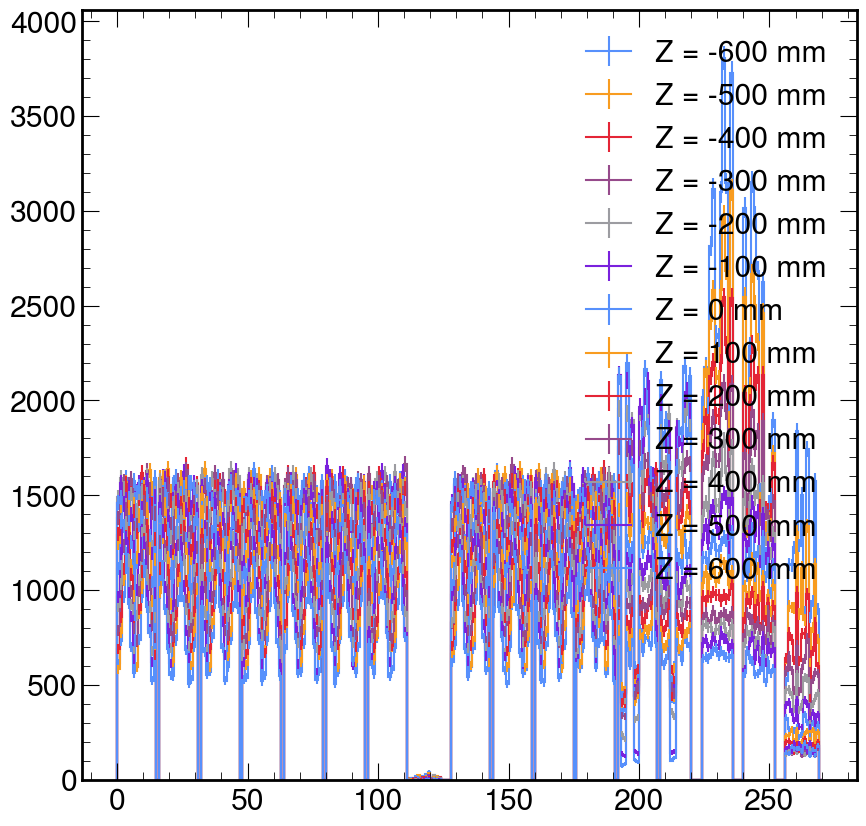

In [6]:
wvl = 442
for zpos in scanned_zpos:
    lcn_nhit = mc_nhits[zpos][wvl]
    hep.histplot(lcn_nhit, yerr=True, label=f"Z = {zpos} mm")
plt.legend()


Text(0.5, 1.0, '514 nm MC')

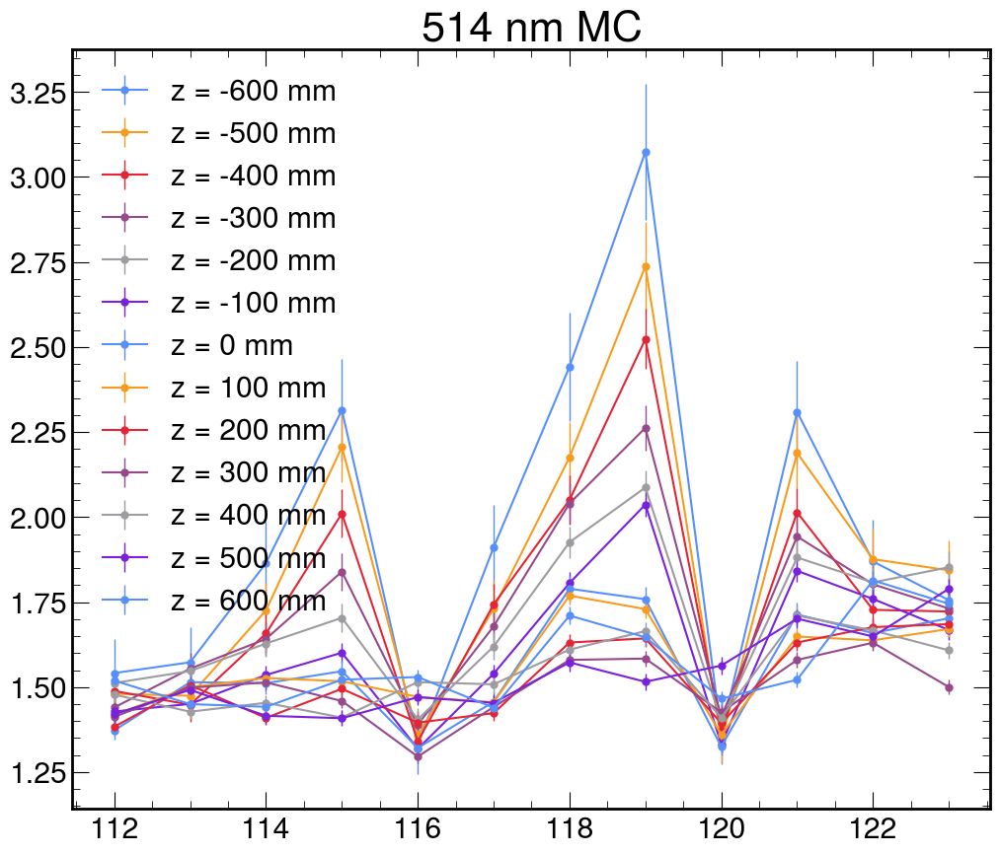

In [7]:
wvl=514
plt.figure(figsize=(12, 10))
for zpos in scanned_zpos:
    lcn_nhit = mc_nhits[zpos][wvl]
    norm = mc_norms[zpos][wvl]
    norm_err = mc_norm_err[zpos][wvl]
    d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
    # d8inch_pos = pmtinfo.pos[pmtinfo.type==1]
    # d8inch_rsquared = np.linalg.norm(d8inch_pos - np.array([0, 0, zpos]), axis=1)**2
    hep.histplot(d8inch_ly, edges_d8inch, binwnorm=1/norm,
                 yerr=d8inch_ly * (norm_err / norm), 
                 histtype='errorbar', linestyle='-', label=f'z = {zpos} mm')

plt.legend()
plt.title(f"{wvl} nm MC")


In [ ]:
# plt.figure(figsize=(30, 30))
# for i, zpos in enumerate(scanned_zpos):
#     plt.subplot(3, 3, i+1)
#     for wvl in scanned_wavelengths:
#         norm = mc_norms[zpos][wvl]
#         nhits = mc_nhits[zpos][wvl]
#         hep.histplot(nhits[pmtinfo.get_lcns_by_type(1)], edges_d8inch,
#                      yerr=True, binwnorm=1/norm,
#                      histtype='errorbar', linestyle='-',
#                      label=f'{wvl} nm')
#     plt.legend()
#     plt.title(f"Z = {zpos} mm")

Text(0, 1, 'Z position [mm]')

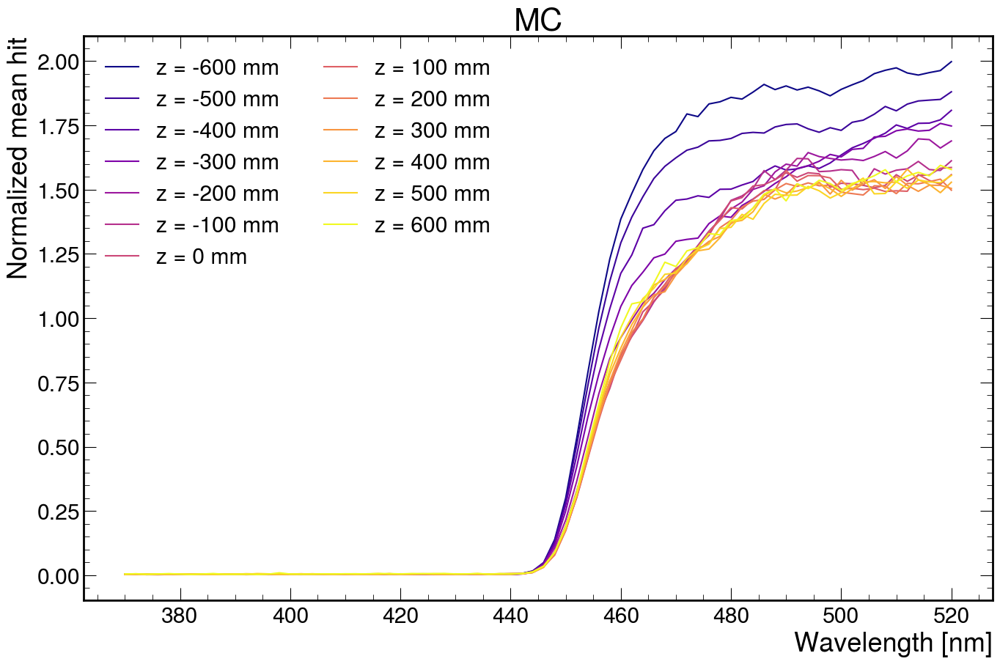

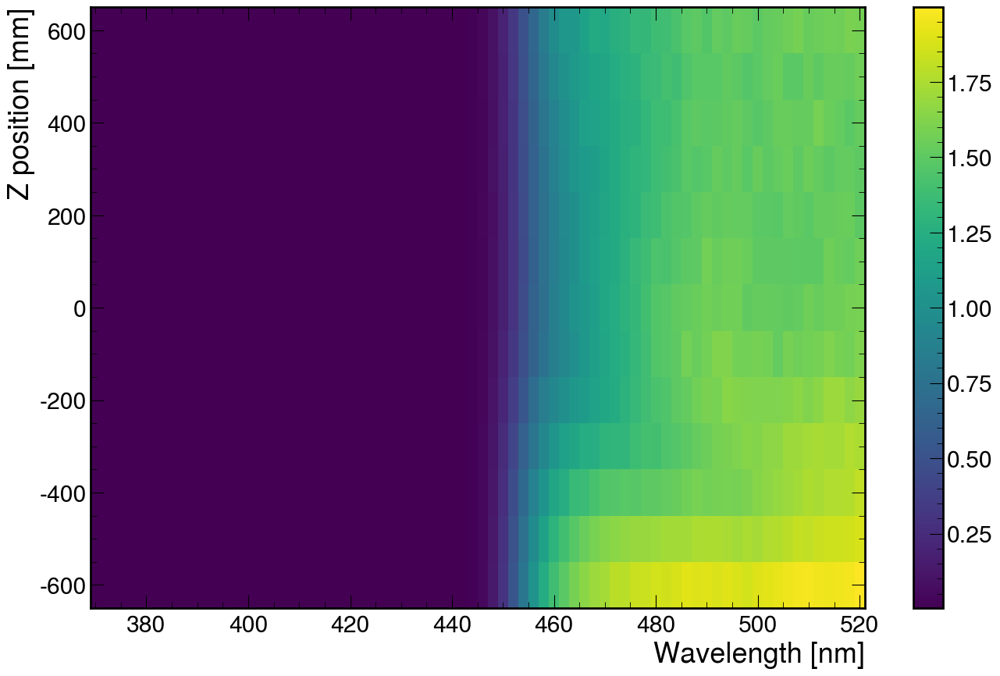

In [8]:
mc_zpos_wvl_grid = np.zeros((scanned_zpos.size, scanned_wavelengths.size))
plt.figure(figsize=(16, 10))

colors = plt.cm.plasma(np.linspace(0, 1, len(scanned_zpos)))
for iz, zpos in enumerate(scanned_zpos):
    mean_hits = []
    for iwvl, wvl in enumerate(scanned_wavelengths):
        lcn_nhit = mc_nhits[zpos][wvl]
        norm = mc_norms[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
        d8inch_ly = d8inch_ly[ch_clean_mask]
        mean_hits.append(np.mean(d8inch_ly)/norm)
        mc_zpos_wvl_grid[iz, iwvl] = np.mean(d8inch_ly)/norm
    scanned_wavelength_bins = (scanned_wavelengths - (scanned_wavelengths[1] - scanned_wavelengths[0])/2).tolist()
    scanned_wavelength_bins.append(scanned_wavelength_bins[-1] + (scanned_wavelengths[1] - scanned_wavelengths[0]))
    plt.plot(scanned_wavelengths, mean_hits, '-', label=f'z = {zpos} mm', color=colors[iz])
plt.legend(ncols=2)
plt.xlabel("Wavelength [nm]")
plt.ylabel("Normalized mean hit")
plt.title("MC")
# plt.semilogy()
plt.figure(figsize=(16, 10))
plt.pcolormesh(scanned_wavelengths, scanned_zpos, mc_zpos_wvl_grid, shading='nearest')
plt.colorbar()
plt.xlabel("Wavelength [nm]")
plt.ylabel("Z position [mm]")

## DATA

In [9]:
data_ttrees = {}
data_dir = "/nfs/disk1/eos/gold_run_ntuples"
data_ttrees[374] = {}
data_ttrees[374][0]    = f"{data_dir}/run330/*.ntuple.root:output"
data_ttrees[374][-100] = f"{data_dir}/run328/*.ntuple.root:output"
data_ttrees[374][-200] = f"{data_dir}/run326/*.ntuple.root:output"
data_ttrees[374][-300] = f"{data_dir}/run325/*.ntuple.root:output"
data_ttrees[374][-400] = f"{data_dir}/run324/*.ntuple.root:output"
data_ttrees[374][-500] = f"{data_dir}/run323/*.ntuple.root:output"
data_ttrees[374][-600] = f"{data_dir}/run322/*.ntuple.root:output"
data_ttrees[374][100]  = f"{data_dir}/run332/*.ntuple.root:output"
data_ttrees[374][200]  = f"{data_dir}/run333/*.ntuple.root:output"
data_ttrees[374][300]  = f"{data_dir}/run334/*.ntuple.root:output"
data_ttrees[374][400]  = f"{data_dir}/run335/*.ntuple.root:output"
data_ttrees[374][500]  = f"{data_dir}/run336/*.ntuple.root:output"
data_ttrees[374][600]  = f"{data_dir}/run337/*.ntuple.root:output"

data_ttrees[408] = {}
data_ttrees[408][0]    = f"{data_dir}/run273/*.ntuple.root:output"
data_ttrees[408][-100] = f"{data_dir}/run274/*.ntuple.root:output"
data_ttrees[408][-200] = f"{data_dir}/run275/*.ntuple.root:output"
data_ttrees[408][-300] = f"{data_dir}/run276/*.ntuple.root:output"
data_ttrees[408][-400] = f"{data_dir}/run277/*.ntuple.root:output"
data_ttrees[408][-500] = f"{data_dir}/run278/*.ntuple.root:output"
data_ttrees[408][-600] = f"{data_dir}/run279/*.ntuple.root:output"
data_ttrees[408][100] = f"{data_dir}/run280/*.ntuple.root:output"
data_ttrees[408][200] = f"{data_dir}/run281/*.ntuple.root:output"
data_ttrees[408][300] = f"{data_dir}/run282/*.ntuple.root:output"
data_ttrees[408][400] = f"{data_dir}/run283/*.ntuple.root:output"
data_ttrees[408][500] = f"{data_dir}/run284/*.ntuple.root:output"
data_ttrees[408][600] = f"{data_dir}/run285/*.ntuple.root:output"

data_ttrees[442] = {}
data_ttrees[442][0]    = f"{data_dir}/run124/*.ntuple.root:output"
data_ttrees[442][-100] = f"{data_dir}/run125/*.ntuple.root:output"
data_ttrees[442][-200] = f"{data_dir}/run126/*.ntuple.root:output"
data_ttrees[442][-300] = f"{data_dir}/run127/*.ntuple.root:output"
data_ttrees[442][-400] = f"{data_dir}/run128/*.ntuple.root:output"
data_ttrees[442][-500] = f"{data_dir}/run129/*.ntuple.root:output"
data_ttrees[442][-600] = f"{data_dir}/run130/*.ntuple.root:output"
data_ttrees[442][100] = f"{data_dir}/run131/*.ntuple.root:output"
data_ttrees[442][200] = f"{data_dir}/run132/*.ntuple.root:output"
data_ttrees[442][300] = f"{data_dir}/run133/*.ntuple.root:output"
data_ttrees[442][400] = f"{data_dir}/run134/*.ntuple.root:output"
data_ttrees[442][500] = f"{data_dir}/run135/*.ntuple.root:output"
data_ttrees[442][600] = f"{data_dir}/run136/*.ntuple.root:output"

data_ttrees[515] = {}
data_ttrees[515][0]    = f"{data_dir}/run149/*.ntuple.root:output"
data_ttrees[515][-100] = f"{data_dir}/run150/*.ntuple.root:output"
data_ttrees[515][-200] = f"{data_dir}/run151/*.ntuple.root:output"
data_ttrees[515][-300] = f"{data_dir}/run152/*.ntuple.root:output"
data_ttrees[515][-400] = f"{data_dir}/run153/*.ntuple.root:output"
data_ttrees[515][-500] = f"{data_dir}/run154/*.ntuple.root:output"
data_ttrees[515][-600] = f"{data_dir}/run155/*.ntuple.root:output"
data_ttrees[515][100] = f"{data_dir}/run156/*.ntuple.root:output"
data_ttrees[515][200] = f"{data_dir}/run157/*.ntuple.root:output"
data_ttrees[515][300] = f"{data_dir}/run158/*.ntuple.root:output"
data_ttrees[515][400] = f"{data_dir}/run159/*.ntuple.root:output"
data_ttrees[515][500] = f"{data_dir}/run160/*.ntuple.root:output"
data_ttrees[515][600] = f"{data_dir}/run161/*.ntuple.root:output"

data_scanned_wavelengths = [374, 408, 442, 515]

In [12]:
def get_tresid(batch, zpos):
    tofs = pmtinfo.time_of_flight(np.asarray([0, 0, zpos]))
    return batch['fitTime'] - [tofs[ev] for ev in batch['digitPMTID']]-10.5


def cut(batch, zpos):
    return batch['digitNCrossings'] == 1 & (np.abs(get_tresid(batch, zpos)) < 10)

def get_datahits_by_lcn(data, zpos):
    hit_histogram = ana.aggregate_histogram(data, "digitPMTID",
                                            expressions=["digitNCrossings", "digitPMTID", "fitTime"],
                                            bin_params={"bins": np.arange(-0.5, 270.5, 1)},
                                            flat_transform_func=pmtinfo.id_to_lcn,
                                            cut_func=lambda batch: cut(batch, zpos),
                                            )
    return hit_histogram


# bottom_8in = pmtinfo.lcn[(pmtinfo.type == 0) & (pmtinfo.z < -800)]
# edges_d8inch = np.arange(np.min(pmtinfo.get_lcns_by_type(1))-0.5, np.max(pmtinfo.get_lcns_by_type(1))+0.6)
# bottom_8in_zpos = np.mean(pmtinfo.z[[lcn in bottom_8in for lcn in pmtinfo.lcn]])
# bottom_10in_zpos = np.mean(pmtinfo.z[pmtinfo.type == 3])
# print(bottom_8in_zpos, bottom_10in_zpos)

use_old_values = False
if 'data_nhits' not in locals() or not use_old_values:
    data_nhits = {}
    for zpos in scanned_zpos:
        data_nhits[zpos] = {}

if 'data_norms' not in locals() or not use_old_values:
    data_norms = {}
    for zpos in scanned_zpos:
        data_norms[zpos] = {}

if 'data_norms' not in locals() or not use_old_values:
    data_norm_err = {}
    for zpos in scanned_zpos:
        data_norm_err[zpos] = {}

for i, zpos in enumerate(scanned_zpos):
    if zpos not in data_norms:
        data_norms[zpos] = {}
        data_nhits[zpos] = {}
        data_norm_err[zpos] = {}
    for wvl in data_scanned_wavelengths:
        if wvl in data_norms[zpos]:
            print(f"{wvl}nm, {zpos}mm is already read, using old value")
            continue
        tree = data_ttrees[wvl][zpos]
        nhits, edges = get_datahits_by_lcn(tree, zpos)
        # bottom_8in_rsquared = np.linalg.norm(bottom_8in_pos - np.array([0, 0, zpos]), axis=1)**2
        bottom_8in_nhit = nhits[bottom_8in]
        bottom_8in_nhit_cleaned = bottom_8in_nhit[bottom_8in_nhit > (0.1*np.mean(bottom_8in_nhit))]
        # bottom_8in_nhit_cleaned_rsquared = bottom_8in_rsquared[bottom_8in_nhit > (0.1*np.mean(bottom_8in_nhit))]
        bottom_8in_ly = np.mean(bottom_8in_nhit_cleaned)
        norm = bottom_8in_ly
        data_norms[zpos][wvl] = norm
        data_nhits[zpos][wvl] = nhits
        data_norm_err[zpos][wvl] = np.std(bottom_8in_nhit_cleaned) / np.sqrt(len(bottom_8in_nhit_cleaned))

/nfs/disk1/eos/gold_run_ntuples/run322/*.ntuple.root:output: 100%|███████████████████████████████████████████████████████████████████| 499169/499169 [00:17<00:00, 28059.14event/s]
/nfs/disk1/eos/gold_run_ntuples/run279/*.ntuple.root:output: 100%|███████████████████████████████████████████████████████████████████| 499170/499170 [00:16<00:00, 30557.33event/s]
/nfs/disk1/eos/gold_run_ntuples/run130/*.ntuple.root:output: 100%|███████████████████████████████████████████████████████████████████| 499165/499165 [00:16<00:00, 29450.81event/s]
/nfs/disk1/eos/gold_run_ntuples/run155/*.ntuple.root:output: 100%|███████████████████████████████████████████████████████████████████| 249588/249588 [00:08<00:00, 29153.04event/s]
/nfs/disk1/eos/gold_run_ntuples/run323/*.ntuple.root:output: 100%|███████████████████████████████████████████████████████████████████| 499163/499163 [00:17<00:00, 27853.19event/s]
/nfs/disk1/eos/gold_run_ntuples/run278/*.ntuple.root:output: 100%|██████████████████████████████████

In [13]:
import pickle
with open('/home/jierans/work/eos/data-analysis/laserball/laserball_nhits.pickle', 'wb') as f:
    pickle.dump([data_nhits, data_norms, data_norm_err], f)

In [10]:
import pickle
with open('/home/jierans/work/eos/data-analysis/laserball/laserball_nhits.pickle', 'rb') as f:
    data_nhits, data_norms, data_norm_err = pickle.load(f)

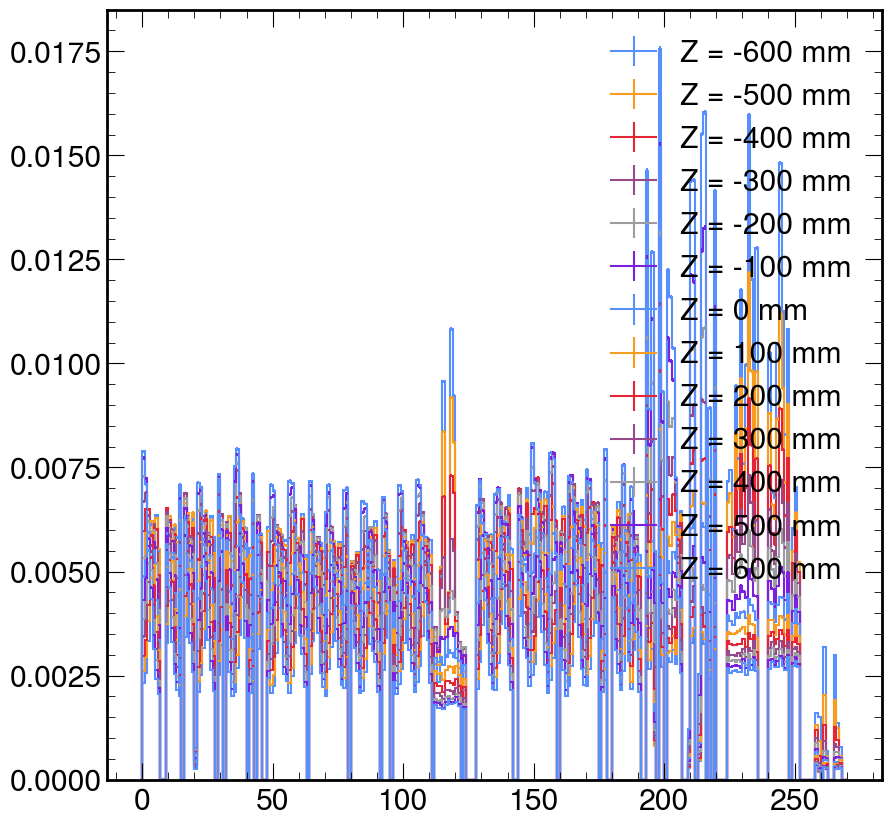

In [14]:
wvl = 442
for zpos in scanned_zpos:
    lcn_nhit = data_nhits[zpos][wvl]
    hep.histplot(lcn_nhit, yerr=True, label=f"Z = {zpos} mm", density=True)
plt.legend()


In [22]:
data_spe_ratio = []
data_ncrossings = []
for z in scanned_zpos:
    total_ncrossings = 0
    one_crossing = 0
    for entry in uproot.iterate(data_ttrees[515][z], ["digitNCrossings", "digitPMTID"]):
        data_ncrossings.extend(ak.sum(entry.digitNCrossings, axis=1))
        ncrossings = ak.flatten(entry.digitNCrossings).to_numpy()
        pmtids = ak.flatten(entry.digitPMTID).to_numpy()
        mask = np.isin(pmtids, (pmtinfo.id[pmtinfo.type == 1]))
        ncrossings = ncrossings[mask]
        total_ncrossings += np.sum(ncrossings)
        one_crossing += np.sum(ncrossings == 1)
    data_spe_ratio.append(one_crossing / total_ncrossings)


sim_spe_ratio = []
sim_ncrossings = []

for z in scanned_zpos:
    total_ncrossings = 0
    one_crossing = 0
    for entry in uproot.iterate(sim_ttrees[514][z], ["digitNCrossings", "digitPMTID"]):
        sim_ncrossings.extend(ak.sum(entry.digitNCrossings, axis=1))
        ncrossings = ak.flatten(entry.digitNCrossings).to_numpy()
        pmtids = ak.flatten(entry.digitPMTID).to_numpy()
        mask = np.isin(pmtids, (pmtinfo.id[pmtinfo.type == 1]))
        ncrossings = ncrossings[mask]
        total_ncrossings += np.sum(ncrossings)
        one_crossing += np.sum(ncrossings == 1)
    sim_spe_ratio.append(one_crossing / total_ncrossings)


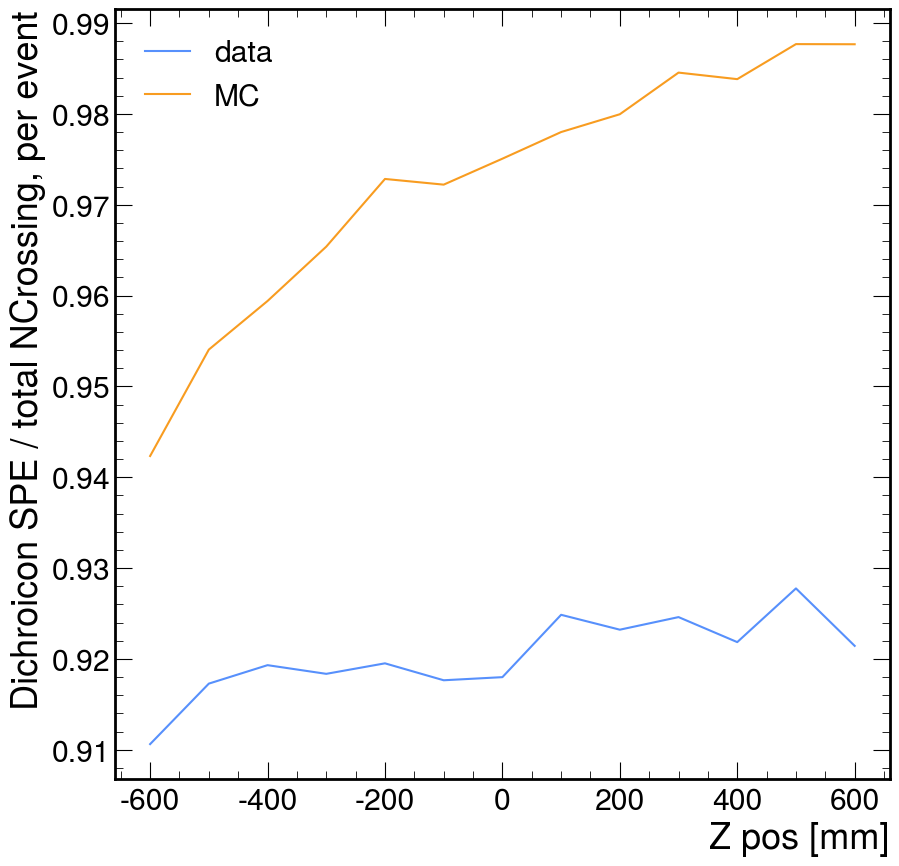

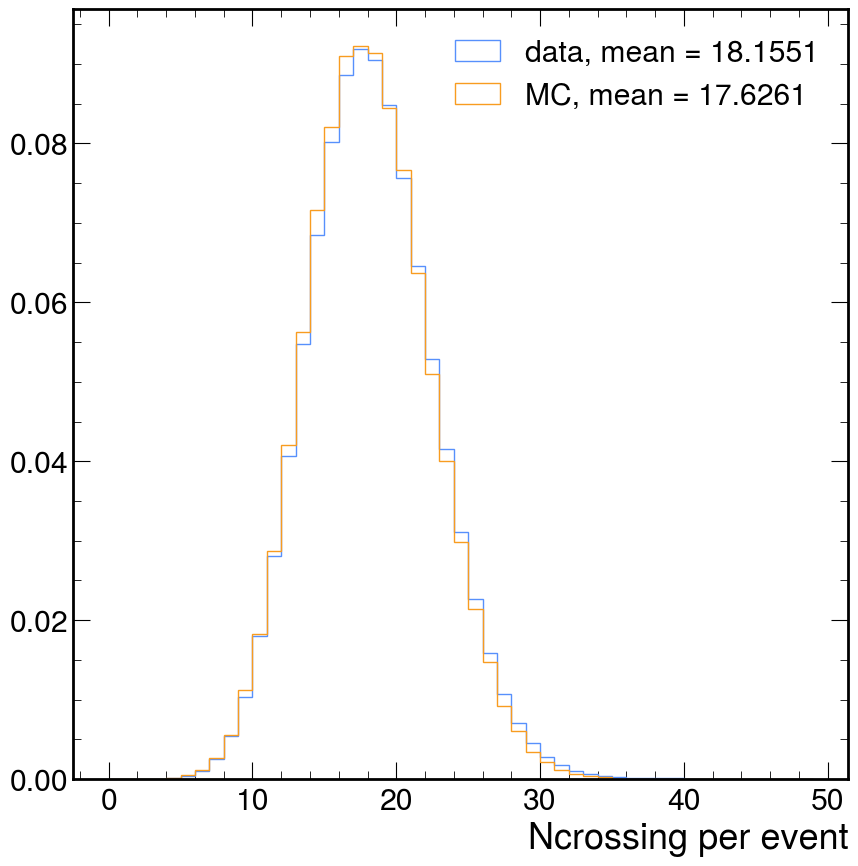

In [43]:
plt.plot(scanned_zpos, data_spe_ratio, label='data')
plt.plot(scanned_zpos, sim_spe_ratio, label='MC')
plt.xlabel("Z pos [mm]")
plt.ylabel("Dichroicon SPE / total NCrossing, per event")
plt.legend()

plt.figure()
plt.hist(data_ncrossings, bins=np.arange(50), density=True, histtype='step', label=f'data, mean = {np.mean(data_ncrossings):.4f}')
plt.hist(sim_ncrossings, bins=np.arange(50), density=True, histtype='step', label=f'MC, mean = {np.mean(sim_ncrossings):.4f}')
plt.xlabel("Ncrossing per event")
plt.legend()
plt.show()

[]

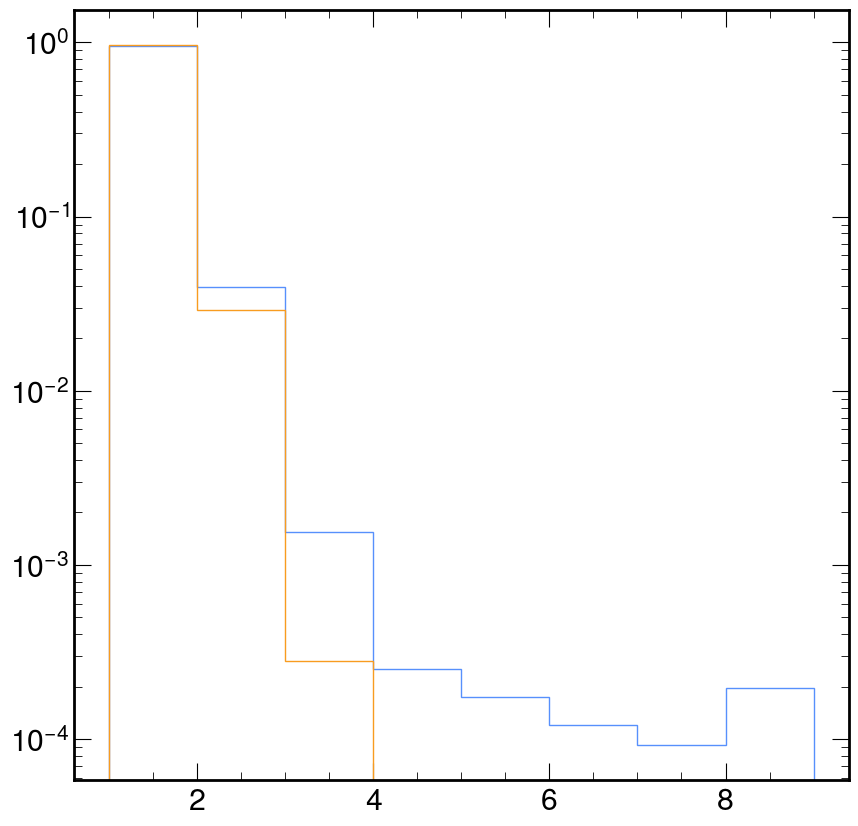

In [50]:
z = -600
ncrossings_tot = []
for entry in uproot.iterate(data_ttrees[515][z], ["digitNCrossings", "digitPMTID"]):
    ncrossings = ak.flatten(entry.digitNCrossings).to_numpy()
    pmtids = ak.flatten(entry.digitPMTID).to_numpy()
    mask = np.isin(pmtids, (pmtinfo.id[pmtinfo.type == 1]))
    ncrossings = ncrossings[mask]
    ncrossings_tot.extend(ncrossings)
plt.hist(ncrossings_tot, bins=np.arange(1, 10), histtype='step', density=True)

ncrossings_tot = []
for entry in uproot.iterate(sim_ttrees[514][z], ["digitNCrossings", "digitPMTID"]):
    ncrossings = ak.flatten(entry.digitNCrossings).to_numpy()
    pmtids = ak.flatten(entry.digitPMTID).to_numpy()
    mask = np.isin(pmtids, (pmtinfo.id[pmtinfo.type == 1]))
    ncrossings = ncrossings[mask]
    ncrossings_tot.extend(ncrossings)
plt.hist(ncrossings_tot, bins=np.arange(1, 10), histtype='step', density=True)
plt.semilogy()

Text(0.5, 1.0, '515 nm')

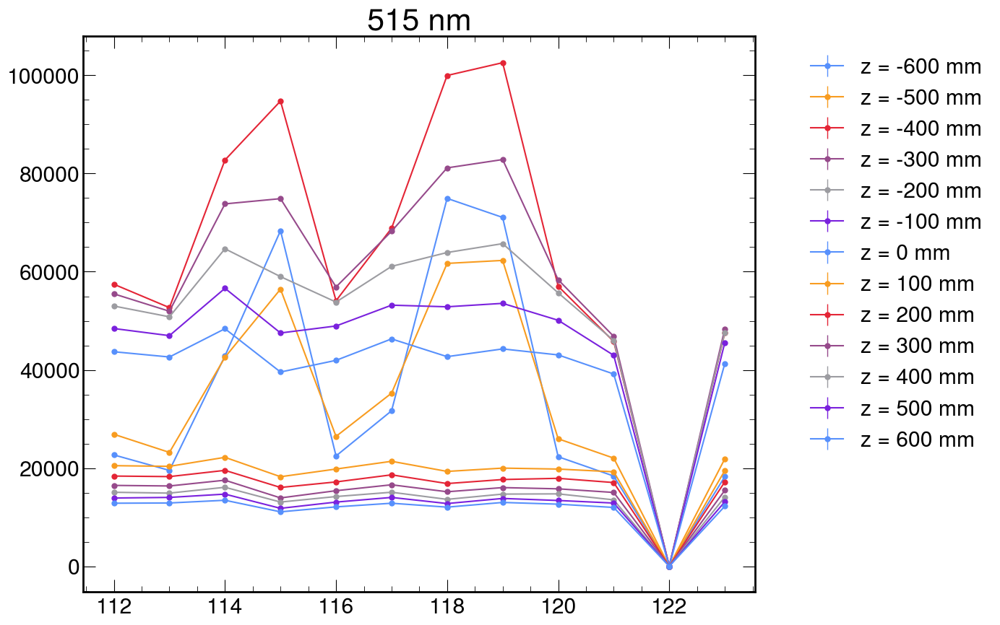

In [15]:
# Dichroic PMT raw hits

wvl=515
plt.figure(figsize=(12, 10))
for zpos in scanned_zpos:
    lcn_nhit = data_nhits[zpos][wvl]
    d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
    hep.histplot(d8inch_ly, edges_d8inch,
                 yerr=True, histtype='errorbar', linestyle='-',
                 label=f'z = {zpos} mm')
    norm = data_norms[zpos][wvl]
    # plt.plot(pmtinfo.get_lcns_by_type(1), norm / d8inch_rsquared, '--')
plt.legend(bbox_to_anchor=(1.05, 1.0))
plt.title(f"{wvl} nm")


32550.695652173912
27546.652173913044
46692.13043478261
39742.0
34057.65217391304
29652.0
25946.17391304348
12308.739130434782
11145.0
10171.08695652174
9428.130434782608
8783.91304347826
8189.739130434783


Text(0.5, 1.0, '515 nm data')

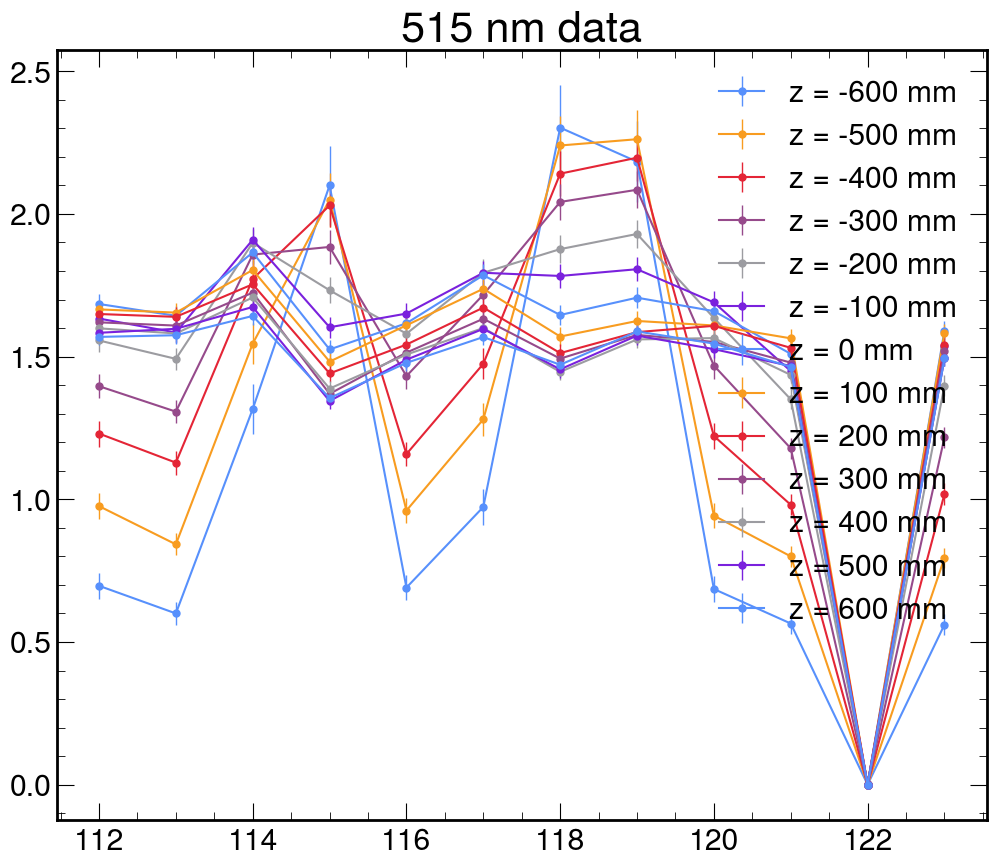

In [16]:
# Dichroic PMT normalized hits

wvl=515
plt.figure(figsize=(12, 10))
for zpos in scanned_zpos:
    lcn_nhit = data_nhits[zpos][wvl]
    norm = data_norms[zpos][wvl]
    norm_err = data_norm_err[zpos][wvl]
    print(norm)
    d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
    hep.histplot(d8inch_ly, edges_d8inch, binwnorm=1/norm,
                 yerr=d8inch_ly * (norm_err / norm), histtype='errorbar', linestyle='-',
                 label=f'z = {zpos} mm')
plt.legend()
plt.title(f"{wvl} nm data")


In [21]:
data_nhits[0].keys()

dict_keys([374, 408, 442, 515])

Text(0, 1, 'Relative lightyield wrt. barrel PMTs')

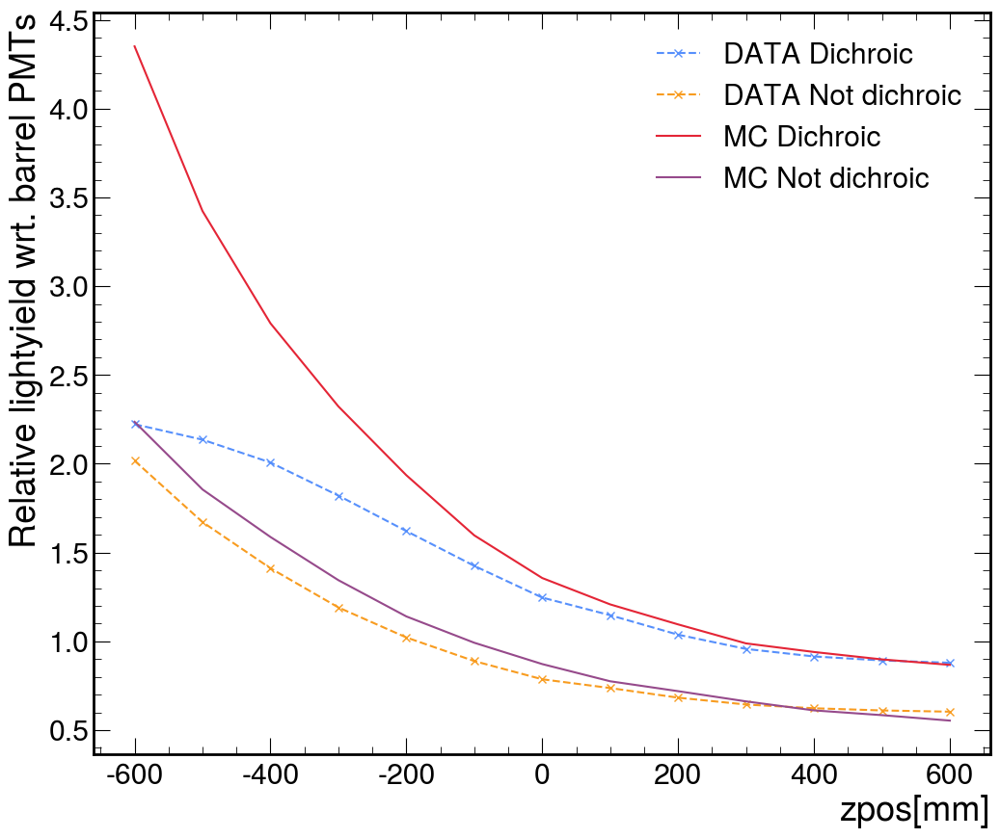

In [26]:
# 515 nm lightyield as function of zpos

wvl=515
plt.figure(figsize=(12, 10))
lys = []
for zpos in scanned_zpos:
    lcn_nhit = data_nhits[zpos][wvl]
    norm = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(0)])
    ly = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(1)])
    lys.append(ly / norm)
plt.plot(scanned_zpos, lys, 'x--', label='DATA Dichroic')

wvl=515
# plt.figure(figsize=(12, 10))
lys = []
for zpos in scanned_zpos:
    lcn_nhit = data_nhits[zpos][wvl]
    norm = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(0)])
    ly = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(4)])
    lys.append(ly / norm)
plt.plot(scanned_zpos, lys, 'x--', label='DATA Not dichroic')


wvl=514
lys = []
for zpos in scanned_zpos:
    lcn_nhit = mc_nhits[zpos][wvl]
    norm = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(0)])
    ly = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(1)])
    lys.append(ly / norm)
plt.plot(scanned_zpos, lys, label='MC Dichroic')

wvl=514
lys = []
for zpos in scanned_zpos:
    lcn_nhit = mc_nhits[zpos][wvl]
    norm = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(0)])
    ly = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(4)])
    lys.append(ly / norm)
plt.plot(scanned_zpos, lys, label='MC Not dichroic')
plt.legend()
plt.xlabel("zpos[mm]")
plt.ylabel("Relative lightyield wrt. barrel PMTs")

[112 113 114 115 116 117 118 119 120 121 122 123]


(0.0, 5.0)

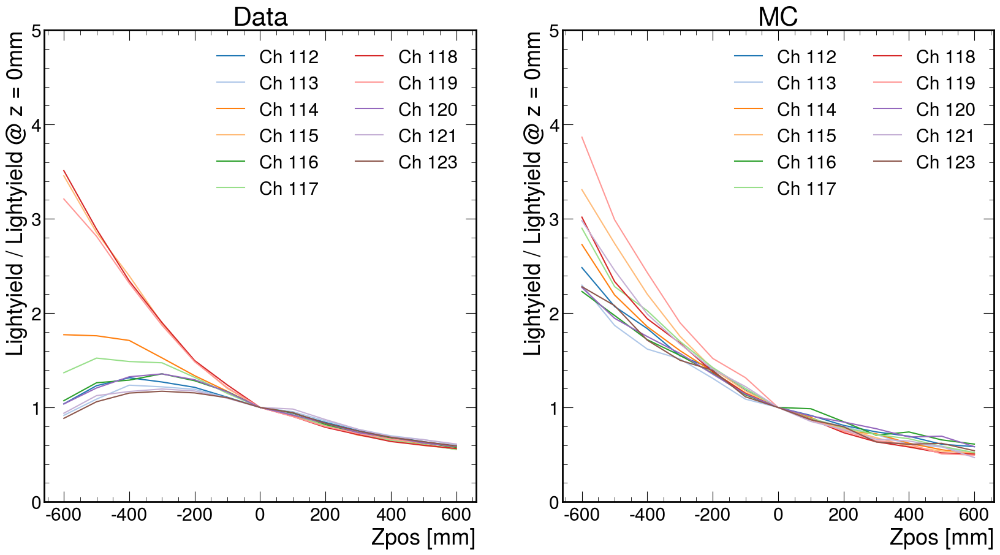

In [15]:
print(pmtinfo.get_lcns_by_type(1))
factors = {
    -600: 1,
    -500: 1,
    -400: 2,
    -300: 2,
    -200: 2,
    -100: 2,
    0   : 2,
    100 : 1,
    200 : 1,
    300 : 1,
    400 : 1,
    500 : 1,
    600 : 1,
    
}
plt.figure(figsize=(20, 10))
axes = plt.subplot(121)
cmap = mpl.colormaps["tab20"]  # type: matplotlib.colors.ListedColormap
colors = cmap.colors  # type: list
axes.set_prop_cycle(color=colors)


for lcn in pmtinfo.get_lcns_by_type(1):
    if lcn==122:
        continue
    ys = np.asarray([data_nhits[z][515][lcn] / factors[z] for z in scanned_zpos])
    ys = ys / ys[6]
    plt.plot(scanned_zpos, ys, label=f'Ch {lcn}')
plt.legend(ncol=2)
plt.title("Data")
plt.ylabel("Lightyield / Lightyield @ z = 0mm")
plt.xlabel("Zpos [mm]")
plt.ylim(0, 5)

axes = plt.subplot(122)
cmap = mpl.colormaps["tab20"]  # type: matplotlib.colors.ListedColormap
colors = cmap.colors  # type: list
axes.set_prop_cycle(color=colors)
for lcn in pmtinfo.get_lcns_by_type(1):
    if lcn==122:
        continue
    ys = np.asarray([mc_nhits[z][514][lcn] for z in scanned_zpos])
    ys = ys / ys[6]
    plt.plot(scanned_zpos, ys, label=f'Ch {lcn}')
plt.legend(ncol=2)
plt.title("MC")
plt.ylabel("Lightyield / Lightyield @ z = 0mm")
plt.xlabel("Zpos [mm]")
plt.ylim(0, 5)
# plt.plot(scanned_zpos,[mc_nhits[z][514][112]*200 for z in scanned_zpos])

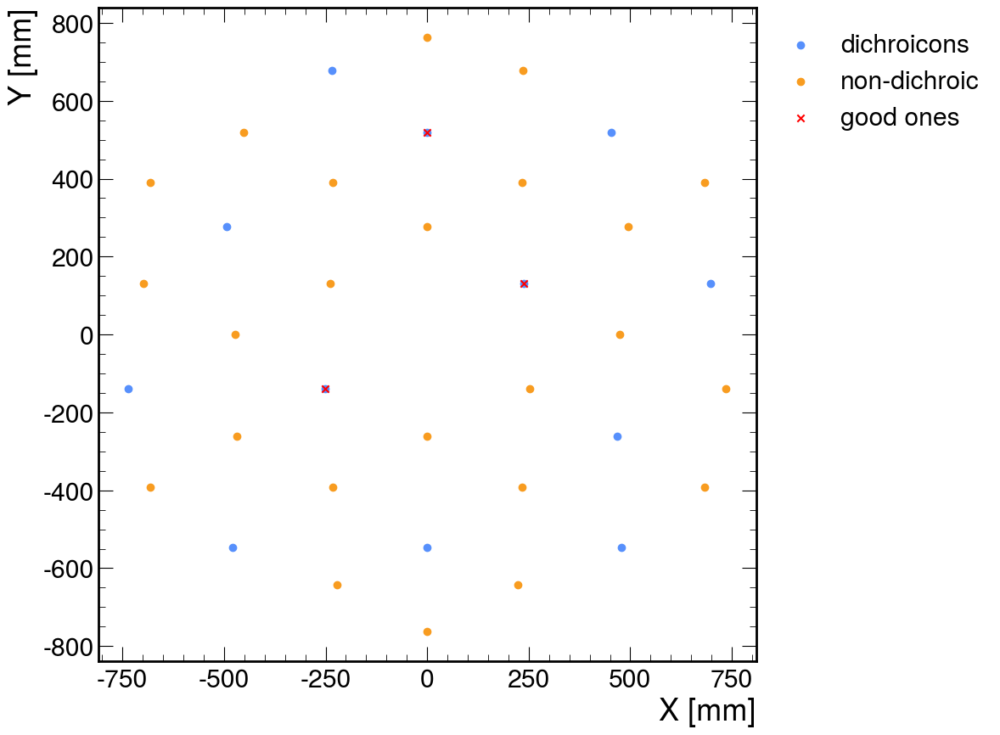

In [40]:
dichroicon_pos = pmtinfo.pos[pmtinfo.type==1]
plt.scatter(dichroicon_pos[:, 0], dichroicon_pos[:, 1], label='dichroicons')
bottom_pos = pmtinfo.pos[pmtinfo.type==4]
plt.scatter(bottom_pos[:, 0], bottom_pos[:, 1], label='non-dichroic')

good_dich_pos = pmtinfo.pos[np.isin(pmtinfo.lcn, [118, 119, 115])]
plt.scatter(good_dich_pos[:, 0], good_dich_pos[:, 1], marker='x', color='r', label='good ones')
plt.xlabel("X [mm]")
plt.ylabel("Y [mm]")
plt.legend(bbox_to_anchor=(1.0, 1.0))


Text(1, 0, 'Z position [mm]')

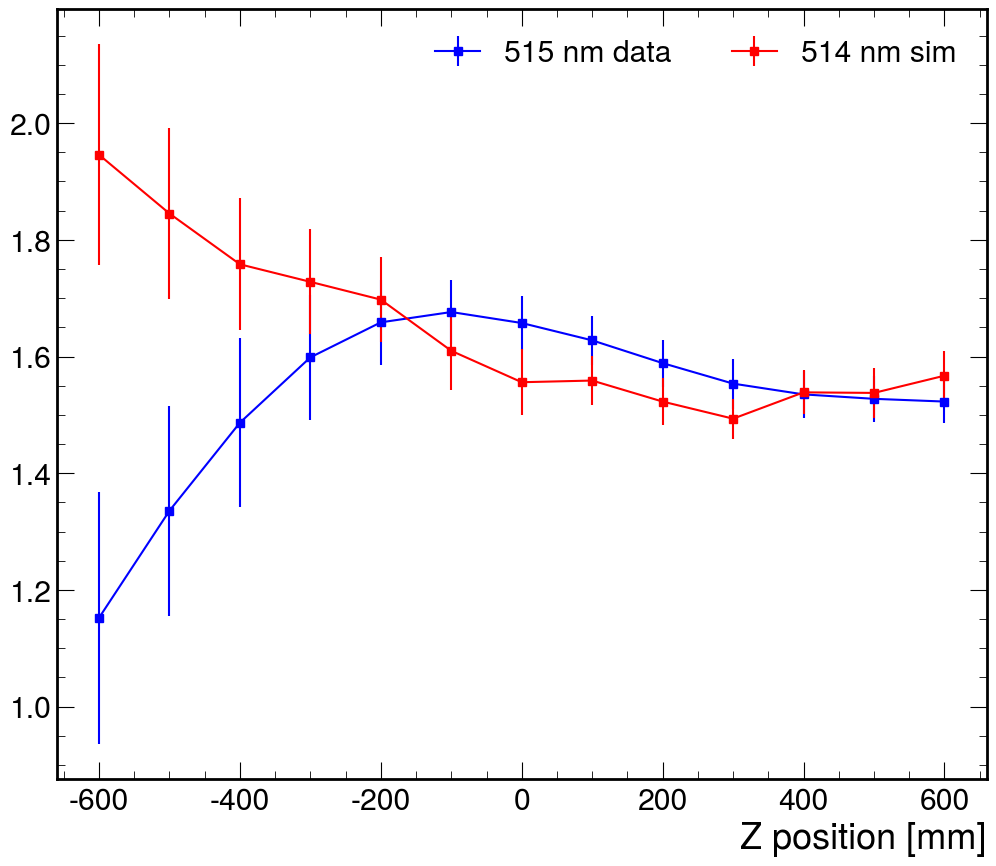

In [16]:
plt.figure(figsize=(12, 10))
for wvl in [515]:
    mean_hits = []
    errs = []
    for zpos in scanned_zpos:
        lcn_nhit = data_nhits[zpos][wvl]
        norm = data_norms[zpos][wvl]
        norm_err = data_norm_err[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
        d8inch_ly = d8inch_ly[ch_clean_mask]
        value = np.mean(d8inch_ly)/norm
        mean_hits.append(value)
        stderr = np.std(d8inch_ly) / np.sqrt(len(d8inch_ly))
        relerr = np.linalg.norm([stderr / np.mean(d8inch_ly), norm_err / norm])
        errs.append(value * relerr)
    plt.errorbar(scanned_zpos, mean_hits, yerr=errs, fmt='bs-', label=f"{wvl} nm data")
plt.gca().set_prop_cycle(None)

# Modify MC Wavelength to be even
for wvl in [514]:
    wvl = 2 * (wvl//2)
    mean_hits = []
    errs = []
    for zpos in scanned_zpos:
        lcn_nhit = mc_nhits[zpos][wvl]
        norm = mc_norms[zpos][wvl]
        norm_err = mc_norm_err[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
        d8inch_ly = d8inch_ly[ch_clean_mask]
        value = np.mean(d8inch_ly)/norm
        mean_hits.append(value)
        stderr = np.std(d8inch_ly) / np.sqrt(len(d8inch_ly))
        relerr = np.linalg.norm([stderr / np.mean(d8inch_ly), norm_err / norm])
        errs.append(value * relerr)
    plt.errorbar(scanned_zpos, mean_hits, yerr=errs, fmt='rs-', label=f"{wvl} nm sim")
plt.legend(ncol=2)
# plt.ylim(-0.5, 4)

plt.xlabel("Z position [mm]")
# plt.semilogy()

In [15]:
data_scanned_wavelengths

[374, 408, 442, 515]

Text(0, 1, 'Normalized mean hit')

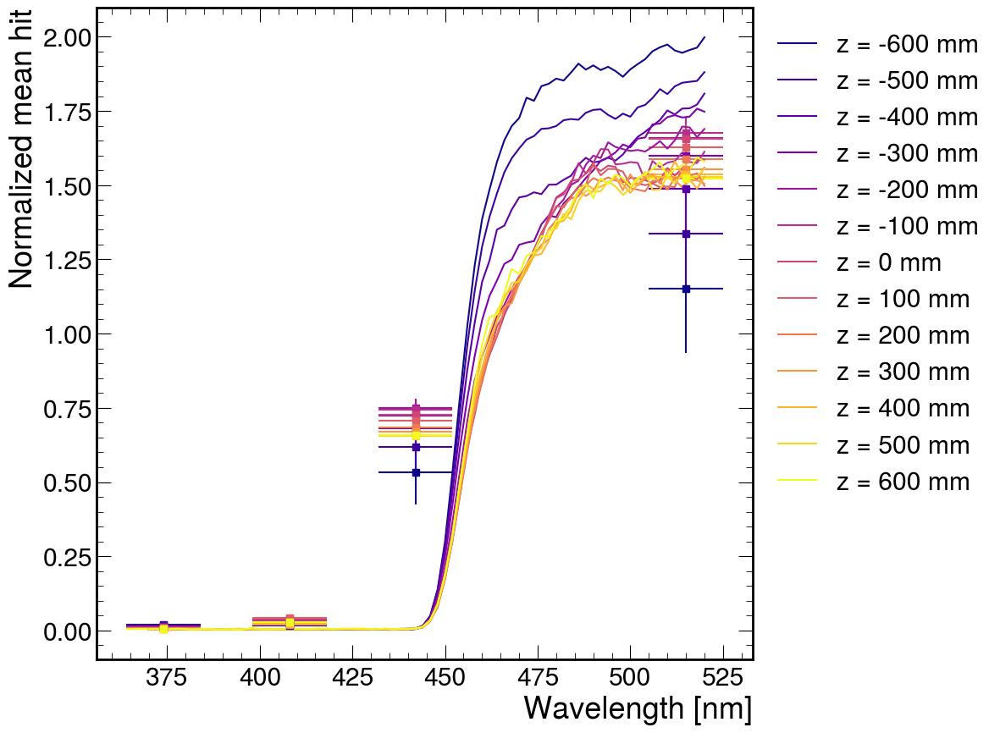

In [17]:
# plt.figure(figsize=(5, 10))
colors = plt.cm.plasma(np.linspace(0, 1, len(scanned_zpos)))

for iz, zpos in enumerate(scanned_zpos):
    # if zpos < 0: continue
    mean_hits = []
    errs = []
    for wvl in scanned_wavelengths:
        lcn_nhit = mc_nhits[zpos][wvl]
        norm = mc_norms[zpos][wvl]
        norm_err = mc_norm_err[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
        d8inch_ly = d8inch_ly[ch_clean_mask]
        value = np.mean(d8inch_ly)/norm
        mean_hits.append(value)
        stderr = np.std(d8inch_ly) / np.sqrt(len(d8inch_ly))
        relerr = np.linalg.norm([stderr / np.mean(d8inch_ly), norm_err / norm])
        errs.append(value * relerr)
    plt.errorbar(scanned_wavelengths, mean_hits, fmt='-', label=f'z = {zpos} mm', color=colors[iz])
    # break
plt.legend()
plt.xlabel("Wavelength [nm]")
plt.ylabel("Normalized mean hit")
# plt.figure()

plt.gca().set_prop_cycle(None)
for iz, zpos in enumerate(scanned_zpos):
    # if zpos < 0: continue
    mean_hits = []
    errs = []
    for wvl in data_scanned_wavelengths:
        lcn_nhit = data_nhits[zpos][wvl]
        norm = data_norms[zpos][wvl]
        norm_err = data_norm_err[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
        d8inch_ly = d8inch_ly[ch_clean_mask]
        value = np.mean(d8inch_ly)/norm
        mean_hits.append(value)
        stderr = np.std(d8inch_ly) / np.sqrt(len(d8inch_ly))
        relerr = np.linalg.norm([stderr / np.mean(d8inch_ly), norm_err / norm])
        errs.append(value * relerr)
    plt.errorbar(data_scanned_wavelengths, mean_hits, yerr=errs, xerr=10, fmt='s', color=colors[iz])
    # break
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
# plt.xlim(480, 530)
# plt.ylim(0.8, 2.2)
plt.xlabel("Wavelength [nm]")
plt.ylabel("Normalized mean hit")
# plt.title("Data vs MC")

Text(0, 1, 'Normalized mean hit')

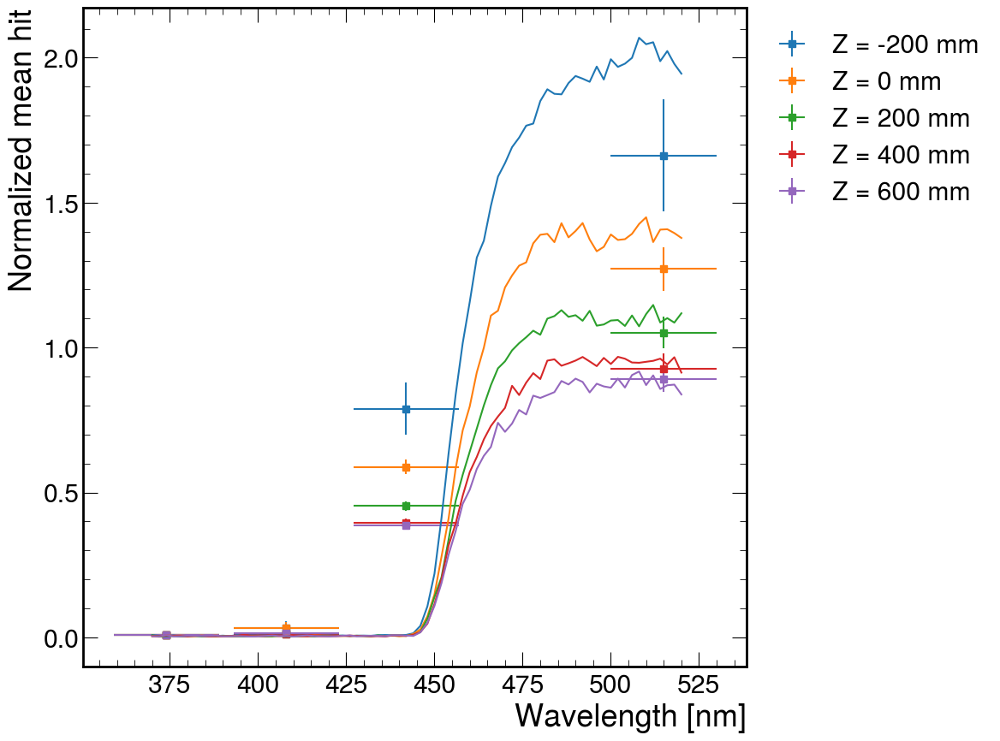

In [55]:
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=plt.get_cmap('tab10').colors)

zpos_to_plot = [-200, 0, 200, 400, 600]

for iz, zpos in enumerate(zpos_to_plot):
    mean_hits = []
    errs = []
    for wvl in data_scanned_wavelengths:
        lcn_nhit = data_nhits[zpos][wvl]
        b8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(0)]
        ch_clean_mask = b8inch_ly > 0.1*np.mean(b8inch_ly)
        b8inch_ly = b8inch_ly[ch_clean_mask]
        norm = np.mean(b8inch_ly)
        
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
        d8inch_ly = d8inch_ly[ch_clean_mask]
        value = np.mean(d8inch_ly) /norm
        errs.append(np.std(d8inch_ly) / norm)
        mean_hits.append(value)

    plt.errorbar(data_scanned_wavelengths, mean_hits, xerr=15, yerr=errs, fmt='s', label=f"Z = {zpos} mm")

plt.gca().set_prop_cycle(None)
for iz, zpos in enumerate(zpos_to_plot):
    mean_hits = []
    errs = []
    for wvl in scanned_wavelengths:
        lcn_nhit = mc_nhits[zpos][wvl]
        b8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(0)]
        ch_clean_mask = b8inch_ly > 0.1*np.mean(b8inch_ly)
        b8inch_ly = b8inch_ly[ch_clean_mask]
        norm = np.mean(b8inch_ly)

        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
        d8inch_ly = d8inch_ly[ch_clean_mask]
        value = np.mean(d8inch_ly)/norm
        mean_hits.append(value)

    plt.errorbar(scanned_wavelengths, mean_hits)
    # break
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
# plt.legend()
# plt.xlim(480, 530)
# plt.ylim(0.8, 2.2)
plt.xlabel("Wavelength [nm]")
plt.ylabel("Normalized mean hit")
# plt.title("Data vs MC")

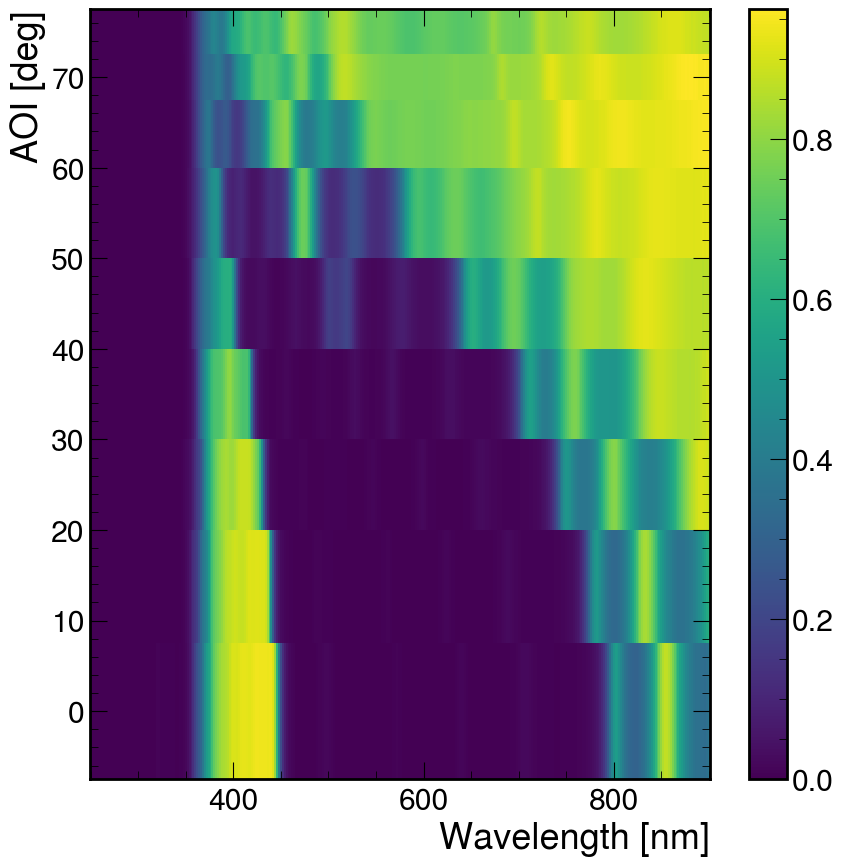

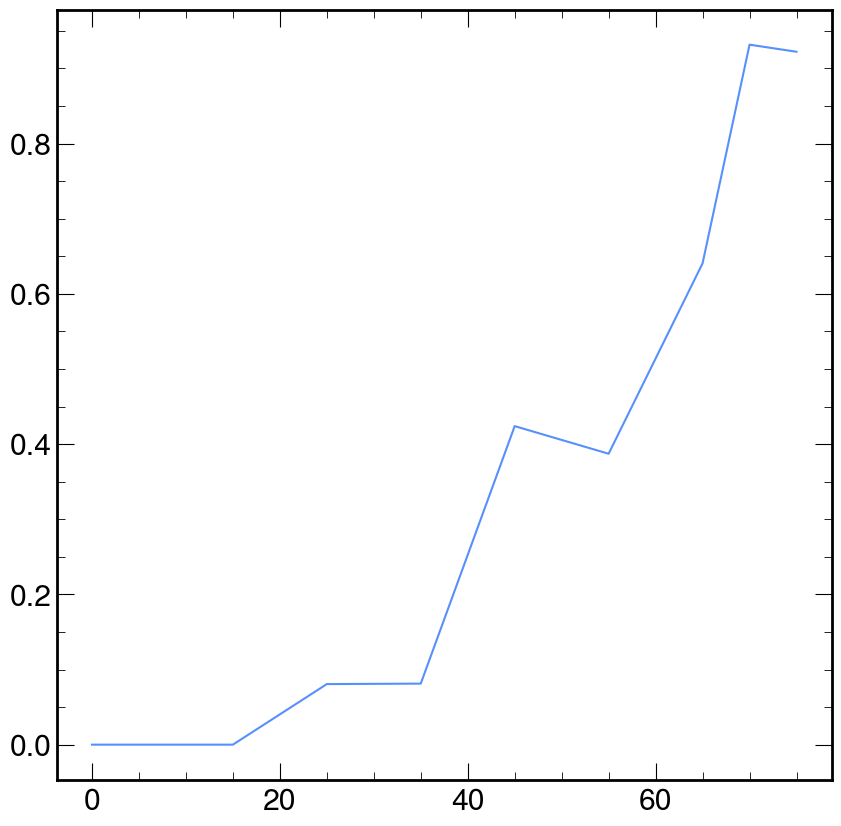

In [9]:
shortpass_data = np.loadtxt("shortpass.txt", delimiter=',')
shortpass_angle = shortpass_data[:, 0]
shortpass_wvl = np.unique(shortpass_data[:, 1])
shortpass_angles = [0, 15, 25, 35, 45, 55, 65, 70, 75]
shortpass_transmission = shortpass_data[:, 2]
zgrid = np.zeros((len(shortpass_angles), shortpass_wvl.size))
for i, angle in enumerate(shortpass_angles):
    shortpass_reflection = (shortpass_transmission[shortpass_angle==angle])
    zgrid[i] = shortpass_reflection
    if angle == 45:
        zgrid[i] *= np.where((shortpass_wvl>450) & (shortpass_wvl < 550), 1, 1)

plt.pcolormesh(shortpass_wvl, shortpass_angles, zgrid, shading="nearest")
plt.colorbar()
# plt.axvline(515, color='r')
plt.xlabel("Wavelength [nm]")
plt.ylabel("AOI [deg]")


plt.figure()
plt.plot(shortpass_angles, (shortpass_data[shortpass_data[:, 1]==514, 2])**0.5)

[0.020667514863951863, 0.01621002957659052, 0.5319301136587951, 1.1521440681279649]
[0.01772348141801065, 0.0190302869990742, 0.6173098952914622, 1.3356977017644376]
[0.015557081687409144, 0.02278338523882781, 0.6817370178152775, 1.4866102564532335]
[0.013804424518690538, 0.02584234683546102, 0.7244581851894943, 1.5985515666960988]
[0.011881184002444627, 0.03049951942863433, 0.7503794254146914, 1.6585726643939958]
[0.010346379562620502, 0.03455450908023106, 0.7447339583213042, 1.6762352378499688]
[0.009051201808636297, 0.0392277587536725, 0.7277097808293482, 1.6574207594865746]
[0.007885300773754537, 0.04315448347447846, 0.7074962083479508, 1.6276905351158002]
[0.007175686844252769, 0.01923245463198603, 0.6828382907269217, 1.5886863248909011]
[0.006391954866941186, 0.02187247499569662, 0.6691255395223423, 1.5535480912530093]
[0.005358902487211819, 0.02344536522410408, 0.6580449709662332, 1.5350869507071807]
[0.004858893926999398, 0.027028890386360714, 0.6554943345510097, 1.527482417102

Text(0.5, 1.0, 'Data')

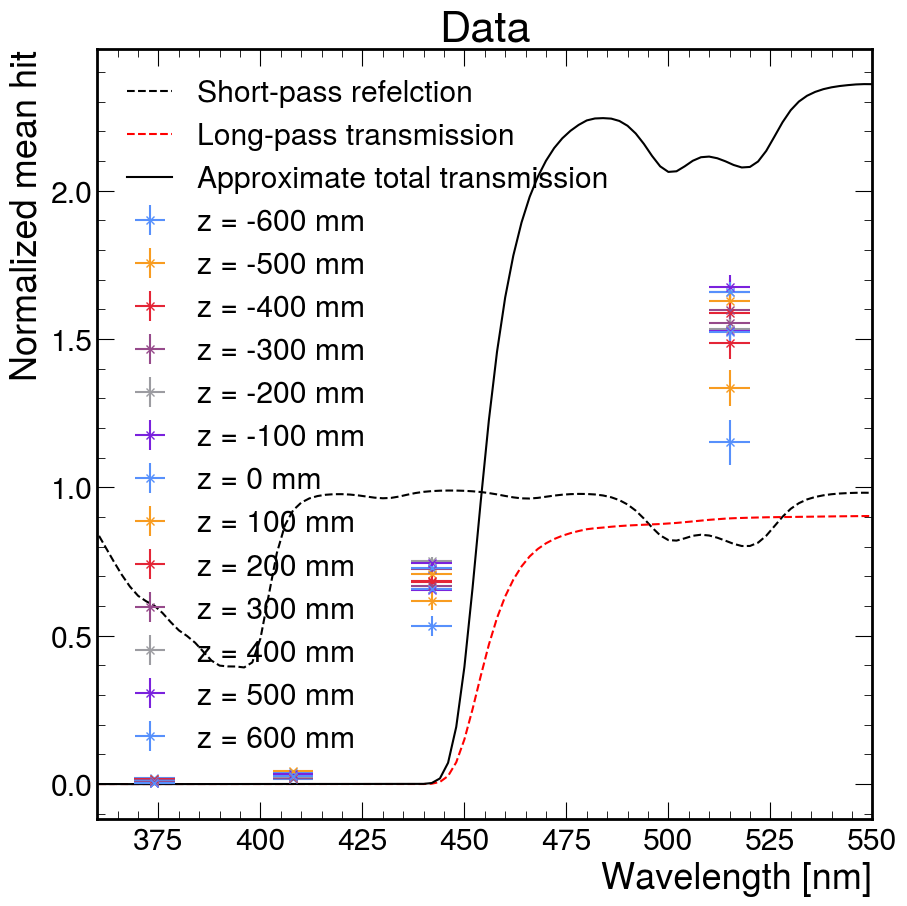

In [15]:
shortpass_data = np.loadtxt("shortpass.txt", delimiter=',')
shortpass_angle = shortpass_data[:, 0]
shortpass_wvl = shortpass_data[:, 1]
shortpass_transmission = shortpass_data[:, 2]
shortpass_reflection = (1-shortpass_transmission[shortpass_angle==45])
plt.plot(shortpass_wvl[shortpass_angle==45], 
         shortpass_reflection, 
         'k--', label="Short-pass refelction")

longpass_data = np.loadtxt("longpass.txt", delimiter=',')
longpass_angle = longpass_data[:, 0]
longpass_wvl = longpass_data[:, 1]
longpass_transmission = longpass_data[:, 2]
plt.plot(longpass_wvl[longpass_angle==0], 
         longpass_transmission[longpass_angle==0], 
         'r--', label="Long-pass transmission")

toy_transmission = longpass_transmission[longpass_angle==0] * (1 + (13**2 - 8**2) / (8**2) * shortpass_reflection)
plt.plot(longpass_wvl[longpass_angle==0], toy_transmission, 'k', label="Approximate total transmission")

for zpos in scanned_zpos:
    mean_hits = []
    mean_errs = []
    for wvl in data_scanned_wavelengths:
        lcn_nhit = data_nhits[zpos][wvl]
        norm = data_norms[zpos][wvl]
        norm_err = data_norm_err[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
        d8inch_ly = d8inch_ly[ch_clean_mask]
        # print(wvl, zpos, np.mean(nhits)/norm)
        mean_hits.append(np.mean(d8inch_ly) / norm)
        mean_errs.append(np.mean(d8inch_ly) / norm * (norm_err / norm))
    fmt='x'
    # if zpos < 0: continue
    plt.errorbar(data_scanned_wavelengths, mean_hits, xerr=5, yerr=mean_errs, fmt=fmt, label=f'z = {zpos} mm')
    print(mean_hits)
    # break
plt.legend()
plt.xlabel("Wavelength [nm]")
plt.ylabel("Normalized mean hit")
plt.xlim(360, 550)
plt.title("Data")

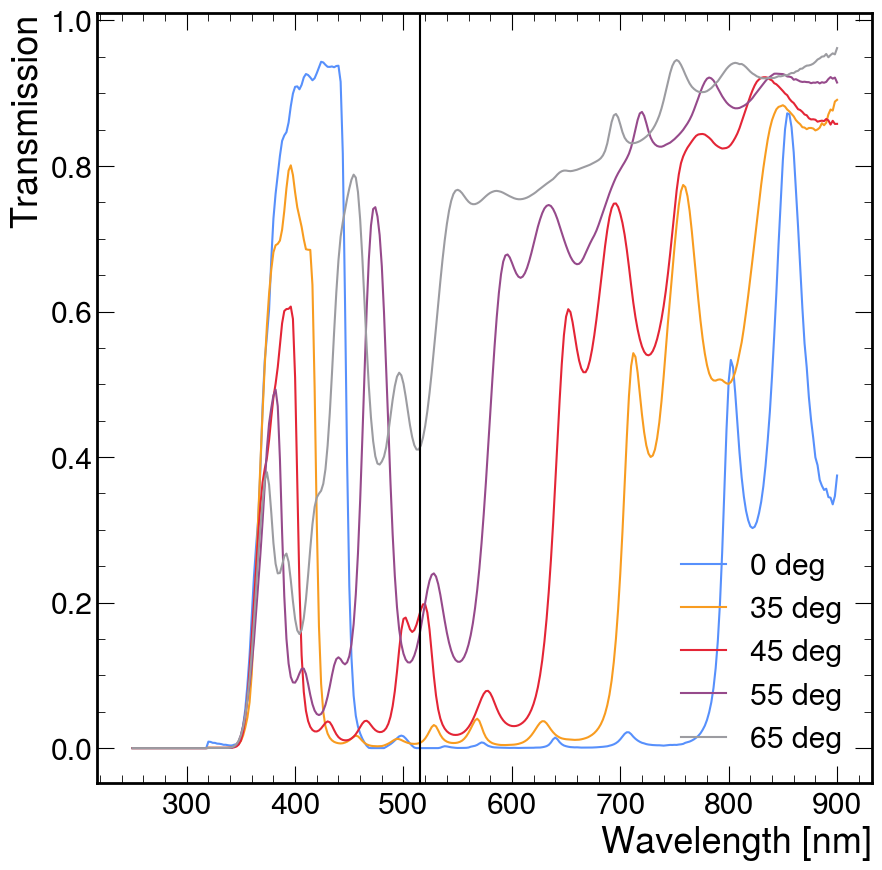

In [167]:
wvl = np.arange(250, 951)
plt.plot(shortpass_wvl, shortpass_transmission[shortpass_angle==0], label="0 deg")
plt.plot(shortpass_wvl, shortpass_transmission[shortpass_angle==35], label="35 deg")

plt.plot(shortpass_wvl, shortpass_transmission[shortpass_angle==45], label="45 deg")
plt.plot(shortpass_wvl, shortpass_transmission[shortpass_angle==55], label="55 deg")
plt.plot(shortpass_wvl, shortpass_transmission[shortpass_angle==65], label="65 deg")

plt.legend()
plt.xlabel("Wavelength [nm]")
plt.ylabel("Transmission")
plt.axvline(515, color='k')
# plt.xlim(500, 600)

[2.141759448016309]


Text(0.5, 1.0, 'MC')

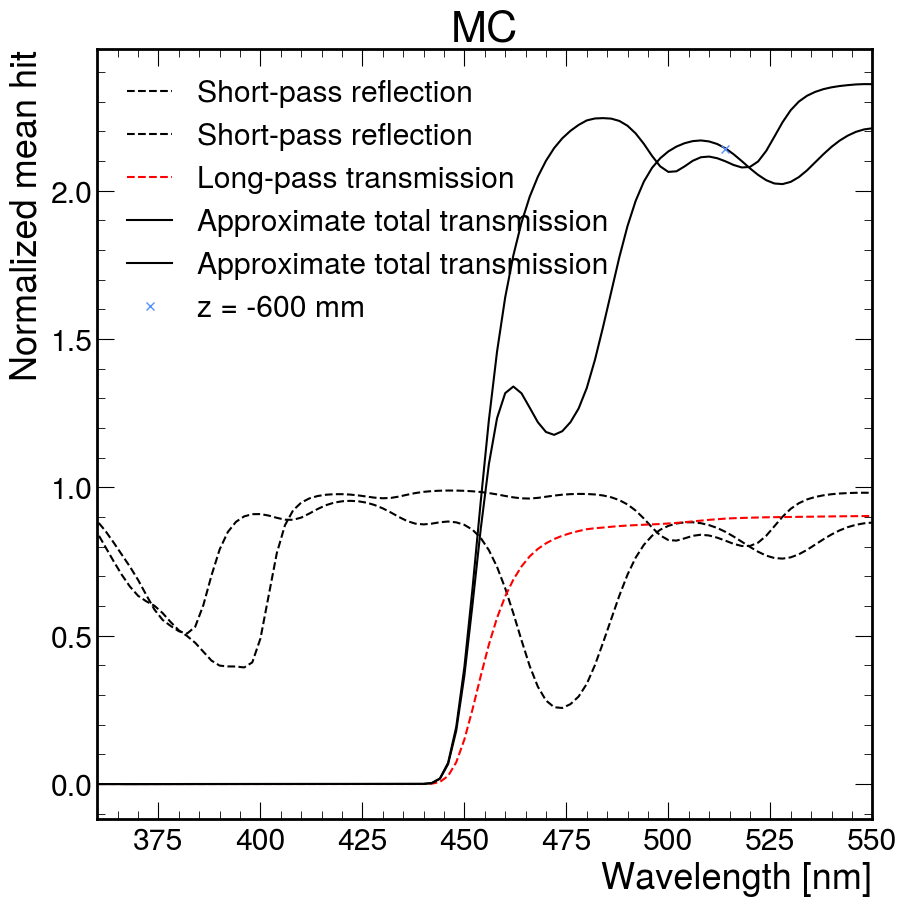

In [97]:
shortpass_data = np.loadtxt("shortpass.txt", delimiter=',')
shortpass_angle = shortpass_data[:, 0]
shortpass_wvl = shortpass_data[:, 1]
shortpass_transmission = shortpass_data[:, 2]
plt.plot(shortpass_wvl[shortpass_angle==55], 
         1-shortpass_transmission[shortpass_angle==55], 
         'k--', label="Short-pass reflection")
plt.plot(shortpass_wvl[shortpass_angle==45], 
         1-shortpass_transmission[shortpass_angle==45], 
         'k--', label="Short-pass reflection")

longpass_data = np.loadtxt("longpass.txt", delimiter=',')
longpass_angle = longpass_data[:, 0]
longpass_wvl = longpass_data[:, 1]
longpass_transmission = longpass_data[:, 2]
plt.plot(longpass_wvl[longpass_angle==0], 
         longpass_transmission[longpass_angle==0], 
         'r--', label="Long-pass transmission")

toy_transmission = longpass_transmission[longpass_angle==0] * (1 + (13**2 - 8**2) / (8**2) * (1-shortpass_transmission[shortpass_angle==45]))
plt.plot(longpass_wvl[longpass_angle==0], toy_transmission, 'k', label="Approximate total transmission")

toy_transmission = longpass_transmission[longpass_angle==0] * (1 + (13**2 - 8**2) / (8**2) * (1-shortpass_transmission[shortpass_angle==55]))
plt.plot(longpass_wvl[longpass_angle==0], toy_transmission, 'k', label="Approximate total transmission")

for zpos in [-600]:
    mean_hits = []
    for wvl in scanned_wavelengths:
        lcn_nhit = mc_nhits[zpos][wvl]
        norm = mc_norms[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
        d8inch_ly = d8inch_ly[ch_clean_mask]
        # print(wvl, zpos, np.mean(nhits)/norm)
        mean_hits.append(np.mean(d8inch_ly) / norm)
    print(mean_hits)
    plt.plot(scanned_wavelengths, mean_hits, 'x', label=f'z = {zpos} mm')
    # break
plt.legend()
plt.xlabel("Wavelength [nm]")
plt.ylabel("Normalized mean hit")
plt.xlim(360, 550)
plt.title("MC")

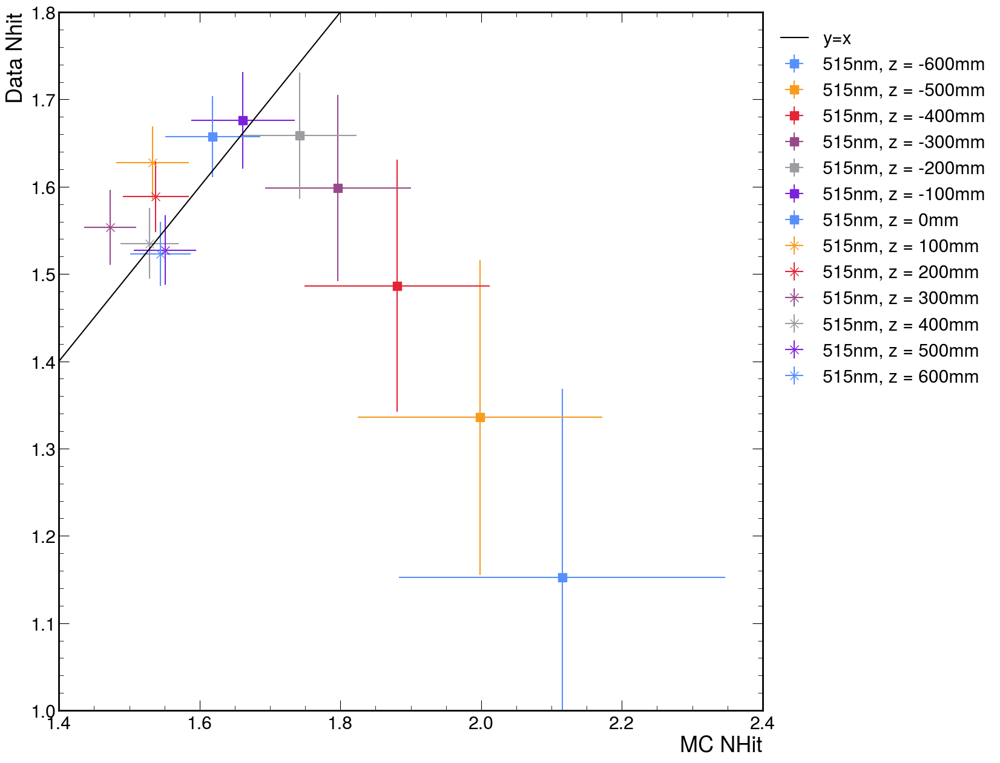

In [92]:
plt.figure(figsize=(15, 15))
for zpos in scanned_zpos:
    # if zpos > 0: continue
    lcn_nhit = mc_nhits[zpos][514]
    norm = mc_norms[zpos][514]
    norm_err = mc_norm_err[zpos][514]
    d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
    ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
    d8inch_ly = d8inch_ly[ch_clean_mask]
    value = np.mean(d8inch_ly)/norm
    mean_nhits_mc = value
    stderr = np.std(d8inch_ly) / np.sqrt(len(d8inch_ly))
    relerr = np.linalg.norm([stderr / np.mean(d8inch_ly), norm_err / norm])
    err_mc = value * relerr

    lcn_nhit = data_nhits[zpos][515]
    norm = data_norms[zpos][515]
    norm_err = data_norm_err[zpos][515]
    d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
    ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
    d8inch_ly = d8inch_ly[ch_clean_mask]
    # print(wvl, zpos, np.mean(nhits)/norm)
    value = np.mean(d8inch_ly)/norm
    mean_nhits_data = value
    stderr = np.std(d8inch_ly) / np.sqrt(len(d8inch_ly))
    relerr = np.linalg.norm([stderr / np.mean(d8inch_ly), norm_err / norm])
    err_data =  value * relerr

    plt.errorbar(mean_nhits_mc, mean_nhits_data,
                 xerr=err_mc, yerr=err_data,
                 fmt="s" if zpos <= 0 else "x",
                 label=f"{wvl}nm, z = {zpos}mm", markersize=10)

plt.plot(np.arange(1, 2, 0.05), np.arange(1, 2, 0.05), 'k', label='y=x')
plt.xlim(1.4, 2.4)
plt.ylim(1.0, 1.8)
plt.xlabel("MC NHit")
plt.ylabel("Data Nhit")

plt.legend(loc='upper left', bbox_to_anchor=(1, 1))


<Figure size 2500x2000 with 0 Axes>

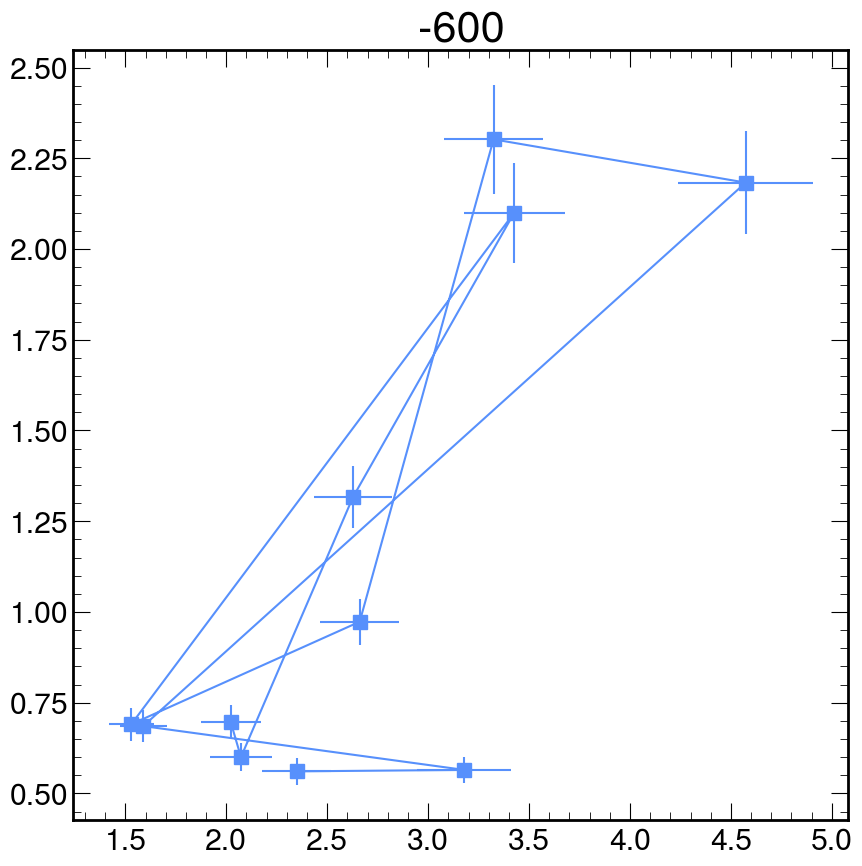

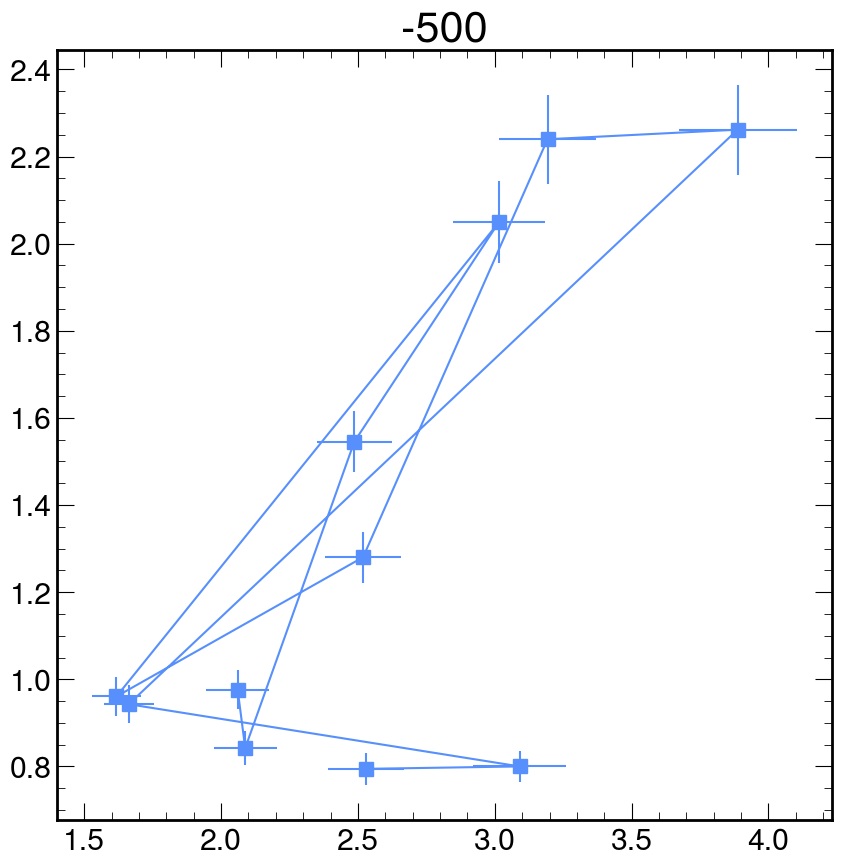

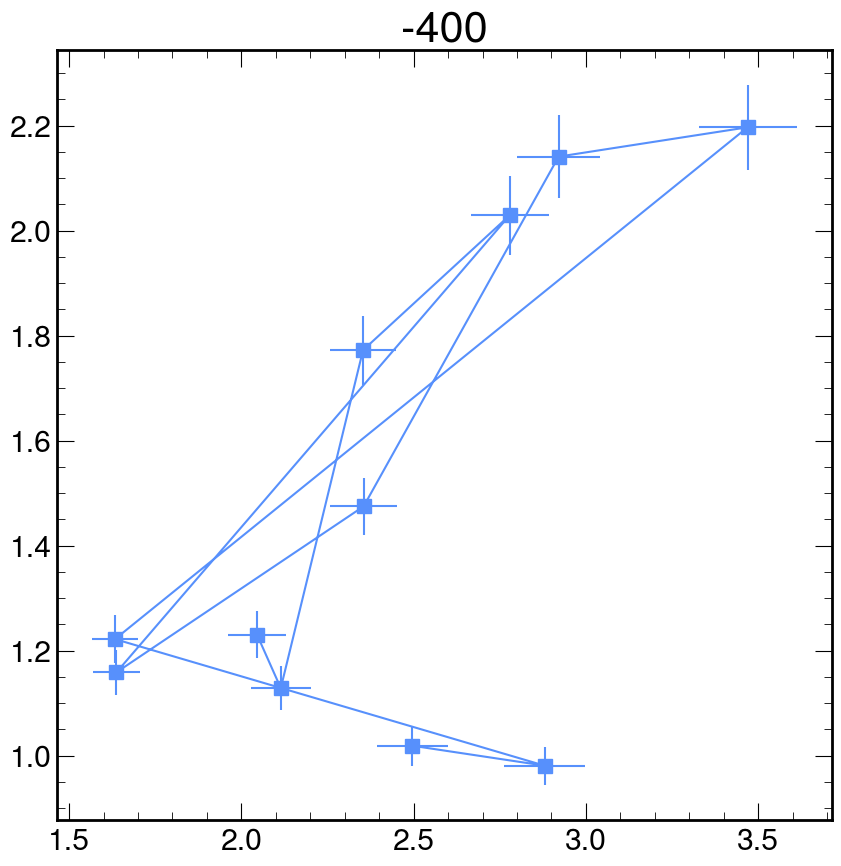

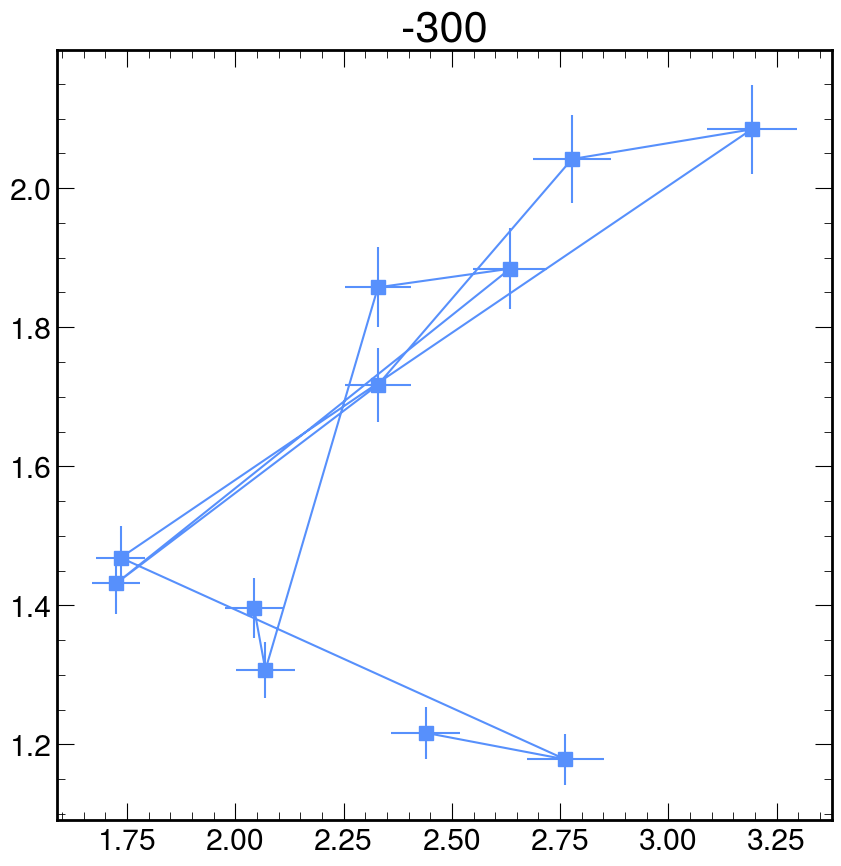

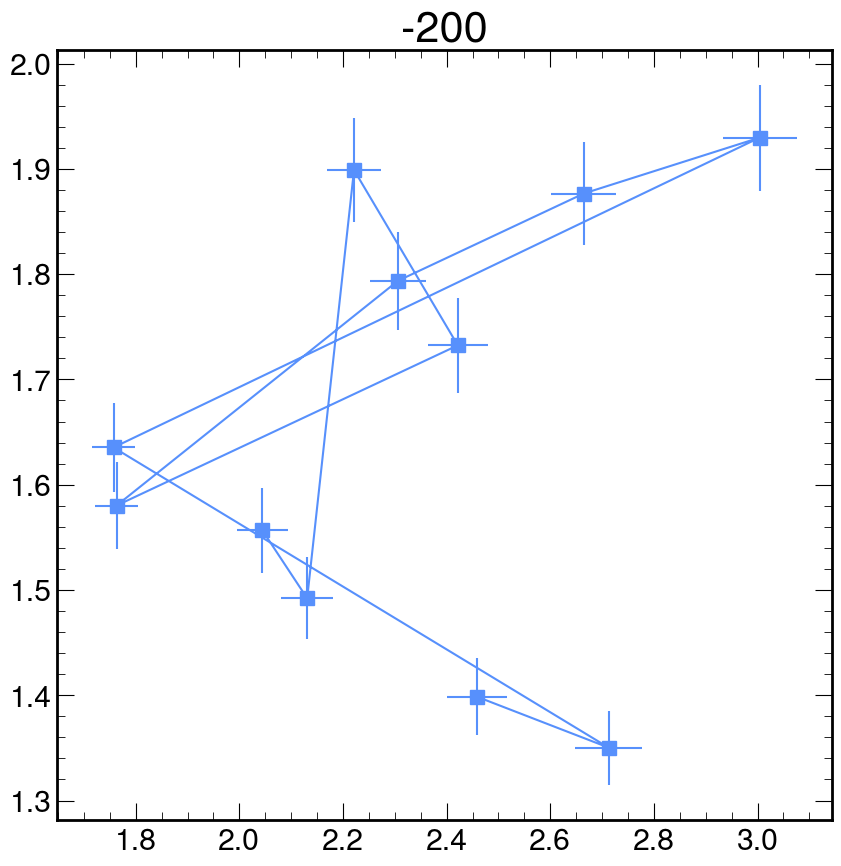

...

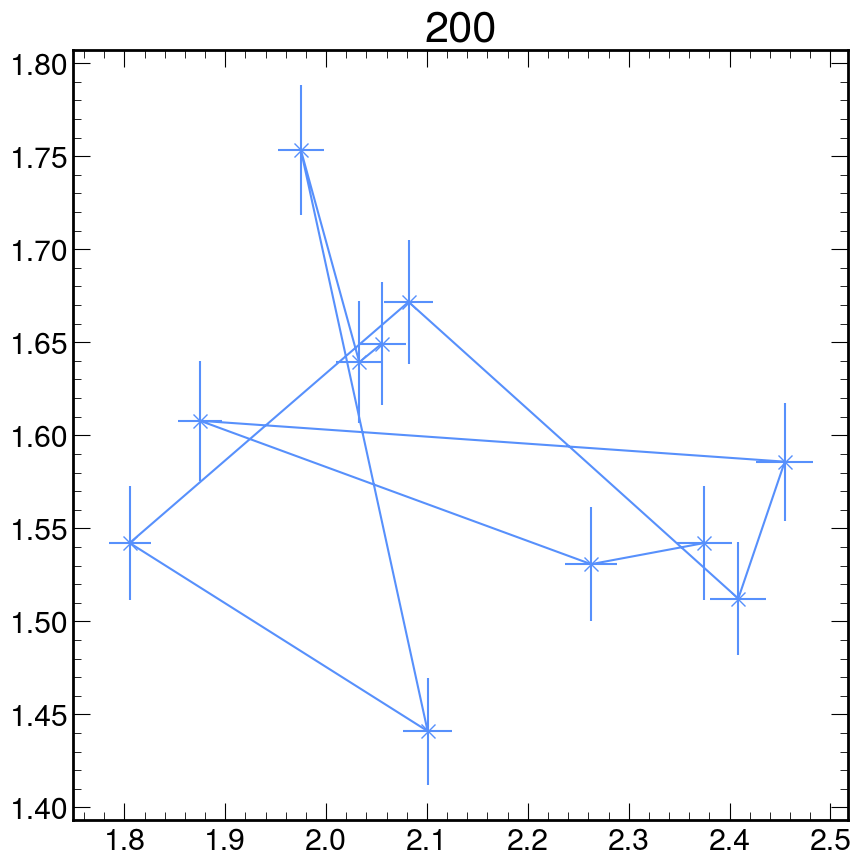

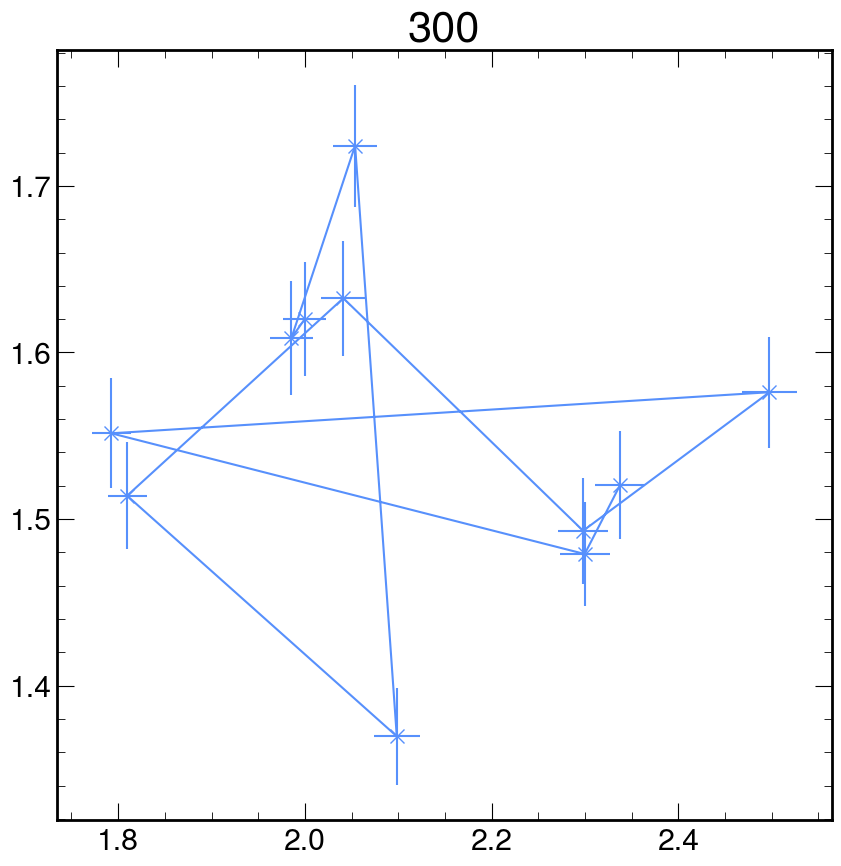

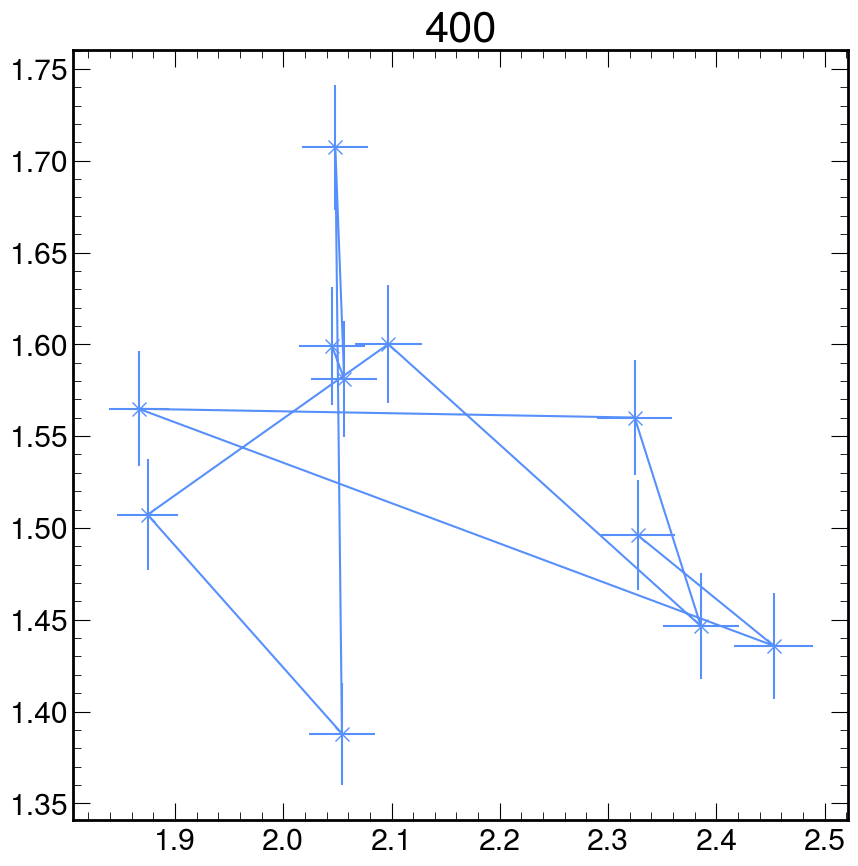

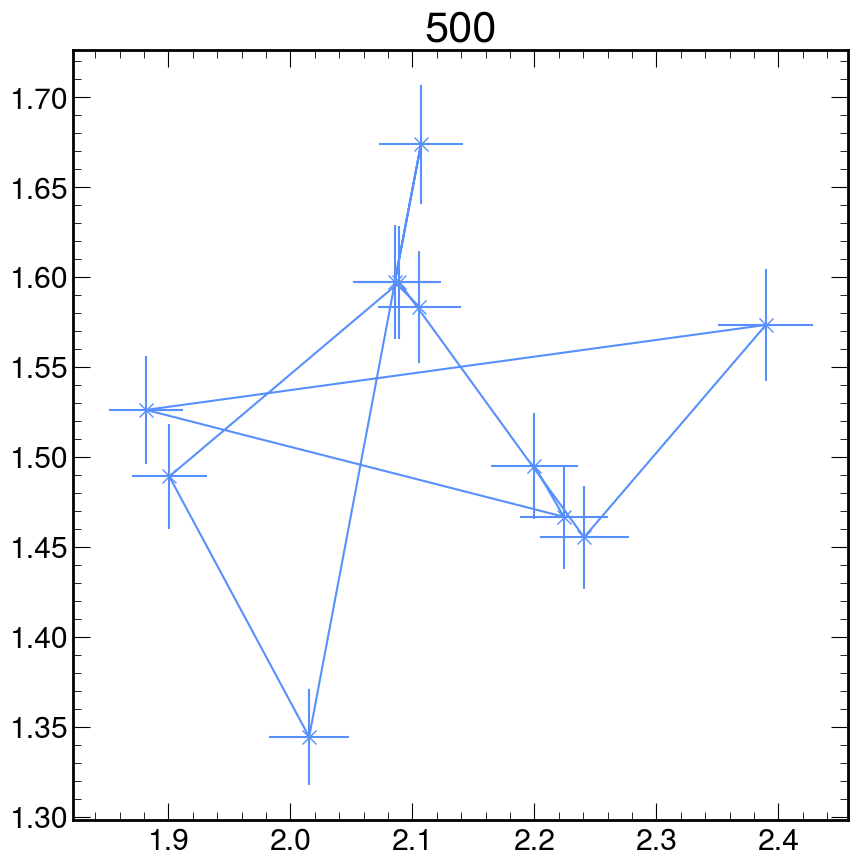

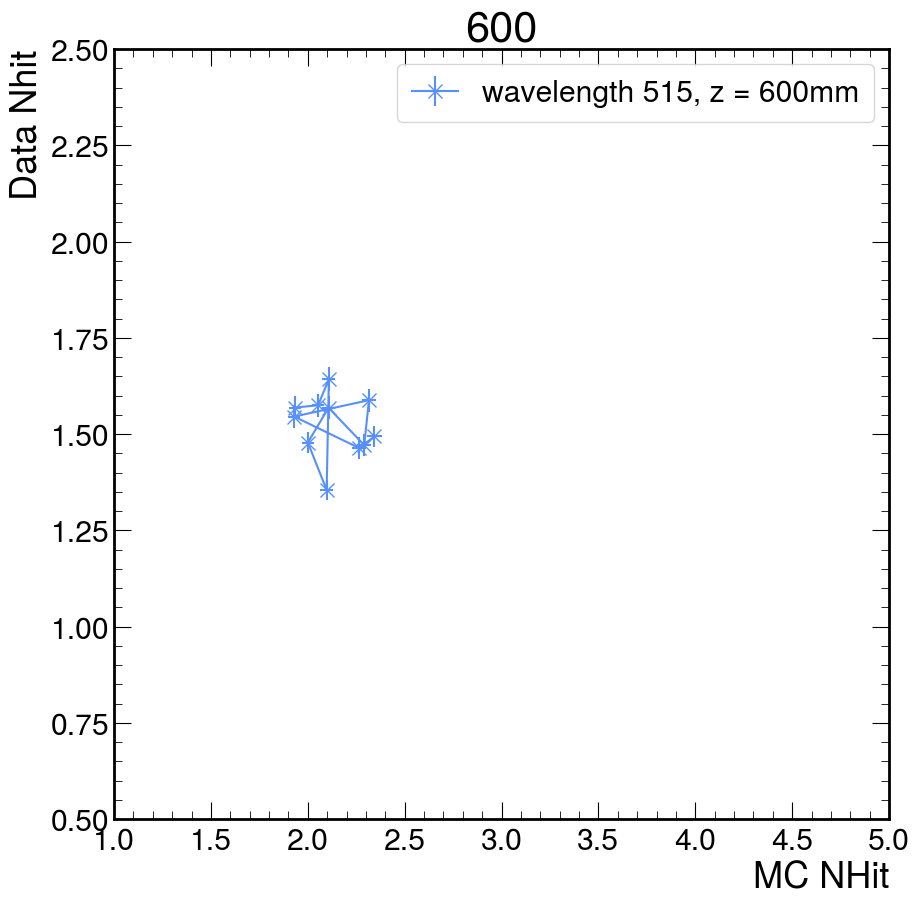

In [138]:
plt.figure(figsize=(25, 20))
for zpos in scanned_zpos:
    plt.figure()
    plt.title(zpos)
    # if zpos > 0: continue
    lcn_nhit = mc_nhits[zpos][514]
    norm = mc_norms[zpos][514]
    norm_err = mc_norm_err[zpos][514]
    # norm = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(0)])
    d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
    # ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
    # d8inch_ly = d8inch_ly[ch_clean_mask]
    nhits_mc = d8inch_ly / norm
    err_mc = nhits_mc * (norm_err / norm)

    lcn_nhit = data_nhits[zpos][515]
    norm = data_norms[zpos][515]
    norm_err = data_norm_err[zpos][515]
    # norm = np.mean(lcn_nhit[pmtinfo.get_lcns_by_type(0)])

    d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
    # ch_clean_mask = d8inch_ly > 0.1*np.mean(d8inch_ly)
    # d8inch_ly = d8inch_ly[ch_clean_mask]
    # print(wvl, zpos, np.mean(nhits)/norm)
    nhits_data = d8inch_ly / norm
    err_data = nhits_data * (norm_err / norm)
    plt.errorbar(nhits_mc[nhits_data > 0.1], nhits_data[nhits_data>0.1],
                 xerr=err_mc[nhits_data > 0.1], yerr=err_data[nhits_data > 0.1],
                 fmt="s-" if zpos <= 0 else "x-",
                 label=f"wavelength {515}, z = {zpos}mm", markersize=10)

plt.xlabel("MC NHit")
plt.ylabel("Data Nhit")
plt.xlim(1, 5)
plt.ylim(0.5, 2.5)
plt.legend(ncols=2, frameon=True)

In [37]:
for zpos in scanned_zpos:
    plt.figure()
    lcn_hits = {lcn : [] for lcn in pmtinfo.get_lcns_by_type(1)}
    mc_mean_hits = []
    for wvl in scanned_wavelengths:
        lcn_nhit = mc_nhits[zpos][wvl]
        norm = mc_norms[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        mc_mean_hits.append(np.mean(d8inch_ly) / norm)

        lcn_nhit = data_nhits[zpos][wvl]
        norm = data_norms[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        # d8inch_ly = d8inch_ly[ch_clean_mask]
        d8inch_ly_normalized = d8inch_ly/norm
        for lcn, ly in zip(pmtinfo.get_lcns_by_type(1), d8inch_ly_normalized):
            lcn_hits[lcn].append(ly)
    for lcn, hits in lcn_hits.items():
        plt.plot(scanned_wavelengths, hits, label=f"{lcn = }")

    plt.plot(scanned_wavelengths, mc_mean_hits, 'k--')
    plt.legend()
    plt.xlabel("Wavelength [nm]")
    plt.ylabel("Normalized mean hit")
    plt.xlim(360, 550)
    plt.title(f"Data, {zpos = } mm")
    # break

KeyError: 370

<Figure size 1000x1000 with 0 Axes>

In [35]:
plt.figure(figsize=(100, 100))

for iz, zpos in enumerate(scanned_zpos):
    data_lcn_hits = {lcn : [] for lcn in pmtinfo.get_lcns_by_type(1)}
    mc_lcn_hits = {lcn : [] for lcn in pmtinfo.get_lcns_by_type(1)}
    for wvl in scanned_wavelengths:
        lcn_nhit = mc_nhits[zpos][wvl]
        norm = mc_norms[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        d8inch_ly_normalized = d8inch_ly/norm
        for lcn, ly in zip(pmtinfo.get_lcns_by_type(1), d8inch_ly_normalized):
            mc_lcn_hits[lcn].append(ly)
    for wvl in data_scanned_wavelengths:
        lcn_nhit = data_nhits[zpos][wvl]
        norm = data_norms[zpos][wvl]
        d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
        d8inch_ly_normalized = d8inch_ly/norm
        for lcn, ly in zip(pmtinfo.get_lcns_by_type(1), d8inch_ly_normalized):
            data_lcn_hits[lcn].append(ly)


    for ilcn, lcn in enumerate(pmtinfo.get_lcns_by_type(1)):
        plt.subplot(12, 13, iz + 1 + 13*ilcn)
        plt.plot(data_scanned_wavelengths, data_lcn_hits[lcn], 's--', label=f"data")
        plt.plot(scanned_wavelengths, mc_lcn_hits[lcn], 's--', label=f"MC")
        plt.xlabel("Wavelength [nm]")
        plt.ylabel("Normalized mean hit")
        plt.title(f"LCN = {lcn}, Zpos = {zpos} mm")
        plt.legend()
    # break

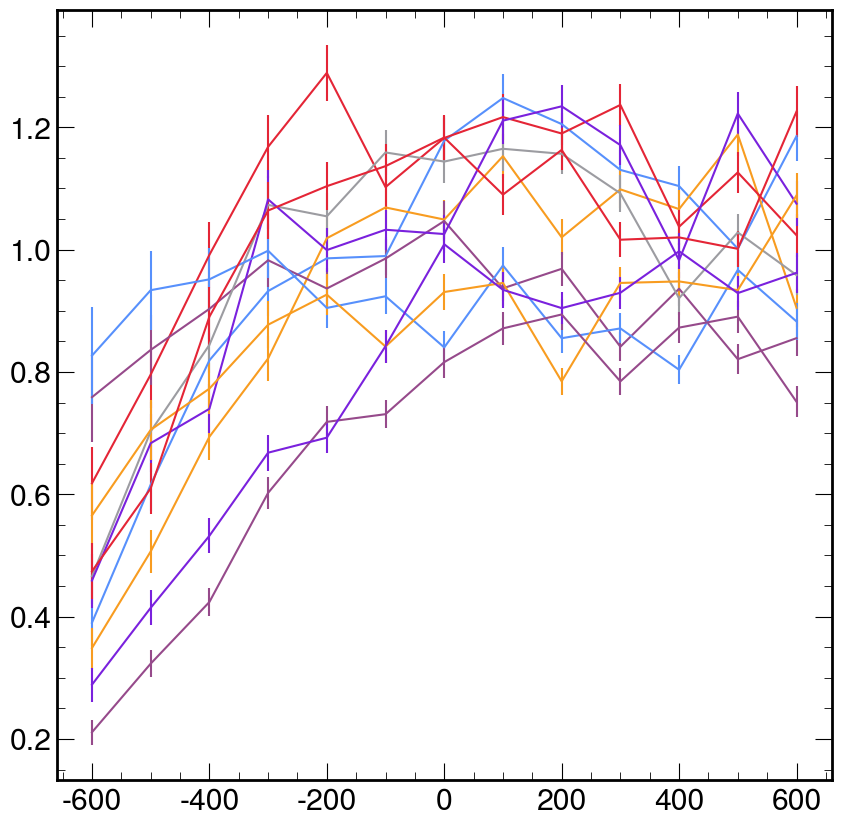

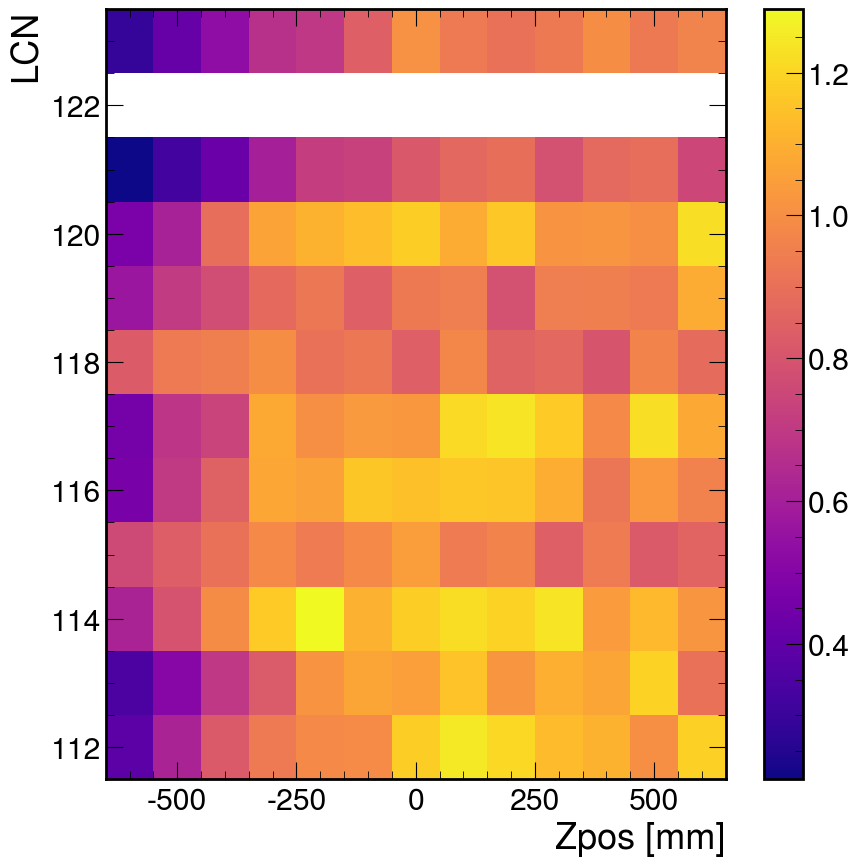

In [195]:
def center_to_edge(array):
    edges = (array - (array[1] - array[0])/2).tolist()
    edges.append(array[-1] + (array[1] - array[0])/2)
    return edges


xs = np.array(scanned_zpos)
ys = np.array(pmtinfo.get_lcns_by_type(1))
zpos_wvl_hitratio = np.zeros(shape=(xs.size, ys.size))
zpos_wvl_hitratio_err = np.zeros(shape=(xs.size, ys.size))

for iz, zpos in enumerate(scanned_zpos):
    data_lcn_hits = {lcn: [] for lcn in pmtinfo.get_lcns_by_type(1)}
    mc_lcn_hits = {lcn: [] for lcn in pmtinfo.get_lcns_by_type(1)}
    data_lcn_relerr = {lcn: [] for lcn in pmtinfo.get_lcns_by_type(1)}
    mc_lcn_relerr = {lcn: [] for lcn in pmtinfo.get_lcns_by_type(1)}
    wvl = 514
    lcn_nhit = mc_nhits[zpos][wvl]
    norm = mc_norms[zpos][wvl]
    norm_err = mc_norm_err[zpos][wvl]
    d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
    d8inch_ly_normalized = d8inch_ly/norm
    mc_relerr = norm_err / norm
    for lcn, ly in zip(pmtinfo.get_lcns_by_type(1), d8inch_ly_normalized):
        mc_lcn_hits[lcn] = ly

    wvl = 515
    lcn_nhit = data_nhits[zpos][wvl]
    norm = data_norms[zpos][wvl]
    norm_err = data_norm_err[zpos][wvl]
    d8inch_ly = lcn_nhit[pmtinfo.get_lcns_by_type(1)]
    d8inch_ly_normalized = d8inch_ly/norm
    data_relerr = norm_err / norm
    for lcn, ly in zip(pmtinfo.get_lcns_by_type(1), d8inch_ly_normalized):
        data_lcn_hits[lcn] = ly

    for ilcn, lcn in enumerate(mc_lcn_hits):
        if lcn == 122:
            zpos_wvl_hitratio[iz][ilcn] = np.nan
            zpos_wvl_hitratio_err[iz][ilcn] = np.nan
        else:
            zpos_wvl_hitratio[iz][ilcn] = data_lcn_hits[lcn] / mc_lcn_hits[lcn]
            zpos_wvl_hitratio_err[iz][ilcn] = zpos_wvl_hitratio[iz][ilcn] * np.linalg.norm([data_relerr, mc_relerr])

plt.figure(figsize=(10, 10))
for ilcn, lcn in enumerate(ys):
    plt.errorbar(xs, zpos_wvl_hitratio[:, ilcn], yerr=zpos_wvl_hitratio_err[:, ilcn])

plt.figure(figsize=(10, 10))
plt.pcolormesh(center_to_edge(xs), center_to_edge(ys), zpos_wvl_hitratio.T, cmap='plasma')
plt.ylabel("LCN")
plt.xlabel("Zpos [mm]")
plt.colorbar()

Text(0, 1, 'Normalized Nhit Data / MC')

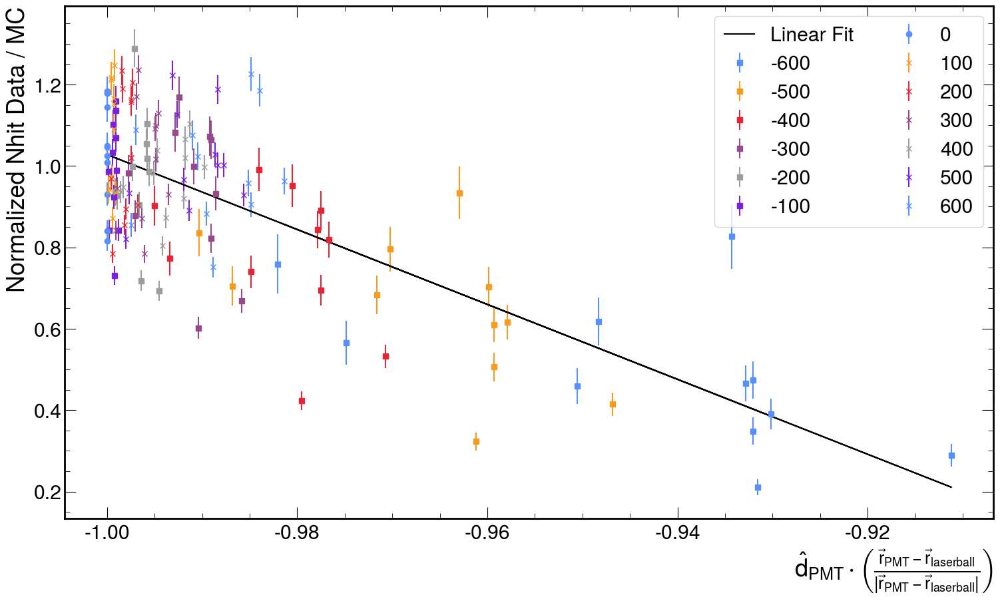

In [196]:
plt.figure(figsize=(18, 10))
xs = []
ys = []
for iz, zpos in enumerate(scanned_zpos):
    pmtdir = pmtinfo.dir
    laserdir = (pmtinfo.pos - np.asarray([0, 0, zpos]))
    laserdir /= np.linalg.norm(laserdir, axis=1)[:, np.newaxis]
    costheta = np.einsum('ij,ij->i', laserdir, pmtdir)
    lcns = pmtinfo.get_lcns_by_type(1)
    if zpos == 0: fmt = 'o'
    elif zpos > 0: fmt = 'x'
    elif zpos < 0: fmt='s'
    plt.errorbar(costheta[pmtinfo.type==1], zpos_wvl_hitratio[iz], yerr=zpos_wvl_hitratio_err[iz],
                 fmt=fmt, label=zpos)
    for x, y in zip(costheta[pmtinfo.type==1], zpos_wvl_hitratio[iz]):
        if not np.isnan(y):
            xs.append(x)
            ys.append(y)
fitresult = np.polyfit(xs, ys, 1)
plt.plot(xs, np.polyval(fitresult, xs), 'k', label='Linear Fit')

plt.legend(frameon=True, ncol=2)
plt.xlabel(r"$\hat{d}_{PMT} \cdot \left(\frac{\vec{r}_{PMT} - \vec{r}_{laserball}}{|\vec{r}_{PMT} - \vec{r}_{laserball}|}\right)$")
plt.ylabel("Normalized Nhit Data / MC")

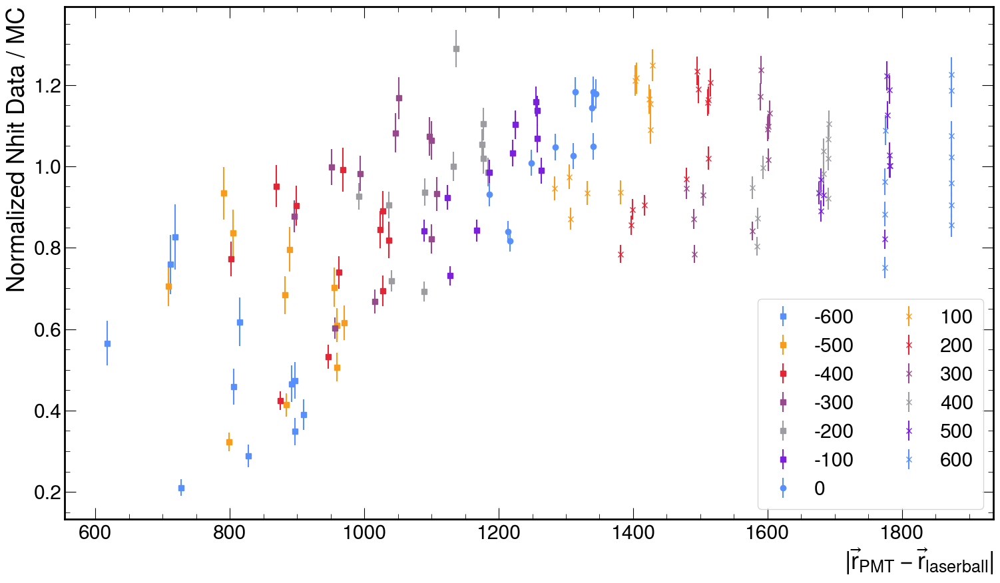

In [36]:
plt.figure(figsize=(18, 10))
for iz, zpos in enumerate(scanned_zpos):
    pmtdir = pmtinfo.dir
    laserdir = (pmtinfo.pos - np.asarray([0, 0, zpos]))
    laser_dist = np.linalg.norm(laserdir, axis=1)
    lcns = pmtinfo.get_lcns_by_type(1)
    if zpos == 0: fmt = 'o'
    elif zpos > 0: fmt = 'x'
    elif zpos < 0: fmt='s'
    plt.errorbar(laser_dist[pmtinfo.type==1], zpos_wvl_hitratio[iz], yerr=zpos_wvl_hitratio_err[iz],
                 fmt=fmt, label=zpos)

plt.xlabel(r"$|\vec{r}_{PMT} - \vec{r}_{laserball}|$")
plt.ylabel("Normalized Nhit Data / MC")

plt.legend(frameon=True, ncols=2)

112 1.1780688695540675
113 1.0491429242997052
114 1.1825743036158374
115 1.0467077685045538
116 1.1439389818249397
117 1.0254418098490747
118 0.8401069865163417
119 0.9306786686995422
120 1.1832355668529555
121 0.816043752647461
122 nan
123 1.0087195072545425


Text(0, 1, 'Normalized Nhit Data / MC')

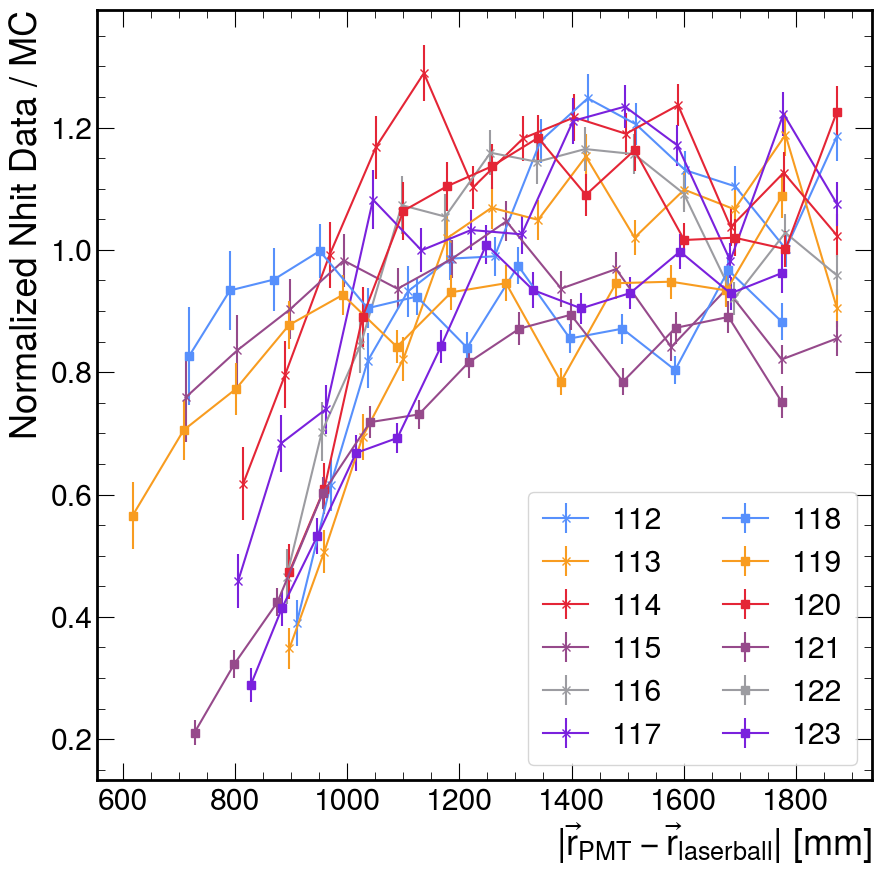

In [37]:
for ilcn, lcn in enumerate(pmtinfo.get_lcns_by_type(1)):
    # plt.subplot(6, 2, ilcn+1)
    ratios = []
    ratio_errs = []
    laser_dists = []
    for iz, zpos in enumerate(scanned_zpos):
        pmtdir = pmtinfo.dir
        laserdir = (pmtinfo.pos - np.asarray([0, 0, zpos]))
        laser_dist = np.linalg.norm(laserdir, axis=1)
        ratios.append(zpos_wvl_hitratio[iz, ilcn])
        ratio_errs.append(zpos_wvl_hitratio_err[iz, ilcn])
        laser_dists.append(laser_dist[pmtinfo.lcn_to_id([lcn])][0])
    fmt = 'x-' if ilcn//6 == 0 else 's-'
    print(lcn, ratios[6])
    plt.errorbar(laser_dists, ratios, yerr=ratio_errs, fmt=fmt, label=lcn)
    # plt.title(f"LCN = {lcn}")
    # break
        
plt.legend(frameon=True, ncol=2)
plt.xlabel(r"$|\vec{r}_{PMT} - \vec{r}_{laserball}|$ [mm]")
plt.ylabel("Normalized Nhit Data / MC")

112 1.2658846028410606
113 1.1272007963568624
114 1.2043748232949152
115 0.9877511827554861
116 1.1907516774930418
117 1.1427021061712135
118 0.9152160458164255
119 0.9301381099925591
120 1.206011577795032
121 0.7896248607386217
122 nan
123 0.9442437509562875


Text(0, 1, 'Normalized Nhit Data / MC')

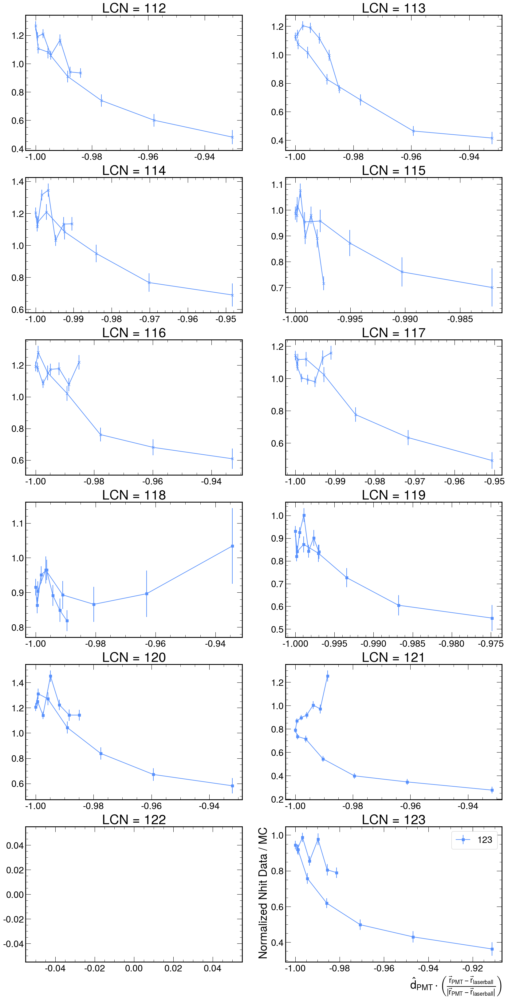

In [16]:
plt.figure(figsize=(20, 40))
# for iz, zpos in enumerate(scanned_zpos):
#     pmtdir = pmtinfo.dir
#     laserdir = (pmtinfo.pos - np.asarray([0, 0, zpos]))
#     laserdir /= np.linalg.norm(laserdir, axis=1)[:, np.newaxis]
#     costheta = np.einsum('ij,ij->i', laserdir, pmtdir)
#     lcns = pmtinfo.get_lcns_by_type(1)
#     if zpos == 0: fmt = 'o'
#     elif zpos > 0: fmt = 'x'
#     elif zpos < 0: fmt='s'
#     plt.errorbar(costheta[pmtinfo.type==1], zpos_wvl_hitratio[iz], yerr=zpos_wvl_hitratio_err[iz],
#                  fmt=fmt, label=zpos)

for ilcn, lcn in enumerate(pmtinfo.get_lcns_by_type(1)):
    plt.subplot(6, 2, ilcn+1)
    ratios = []
    ratio_errs = []
    costhetas = []
    for iz, zpos in enumerate(scanned_zpos):
        pmtdir = pmtinfo.dir
        laserdir = (pmtinfo.pos - np.asarray([0, 0, zpos]))
        laserdir /= np.linalg.norm(laserdir, axis=1)[:, np.newaxis]
        costheta = np.einsum('ij,ij->i', laserdir, pmtdir)
        ratios.append(zpos_wvl_hitratio[iz, ilcn])
        ratio_errs.append(zpos_wvl_hitratio_err[iz, ilcn])
        
        costhetas.append(costheta[pmtinfo.lcn_to_id([lcn])][0])
    fmt = 'x-' if ilcn//6 == 0 else 's-'
    print(lcn, ratios[6])
    plt.errorbar(costhetas, ratios, yerr=ratio_errs, fmt=fmt, label=lcn)
    plt.title(f"LCN = {lcn}")
    # break
        
plt.legend(frameon=True, ncol=2)
plt.xlabel(r"$\hat{d}_{PMT} \cdot \left(\frac{\vec{r}_{PMT} - \vec{r}_{laserball}}{|\vec{r}_{PMT} - \vec{r}_{laserball}|}\right)$")
plt.ylabel("Normalized Nhit Data / MC")

1286.4560683790994
[0.82111197 0.04605268 0.18372098]


Text(0, 1, 'Normalized Nhit Data / MC')

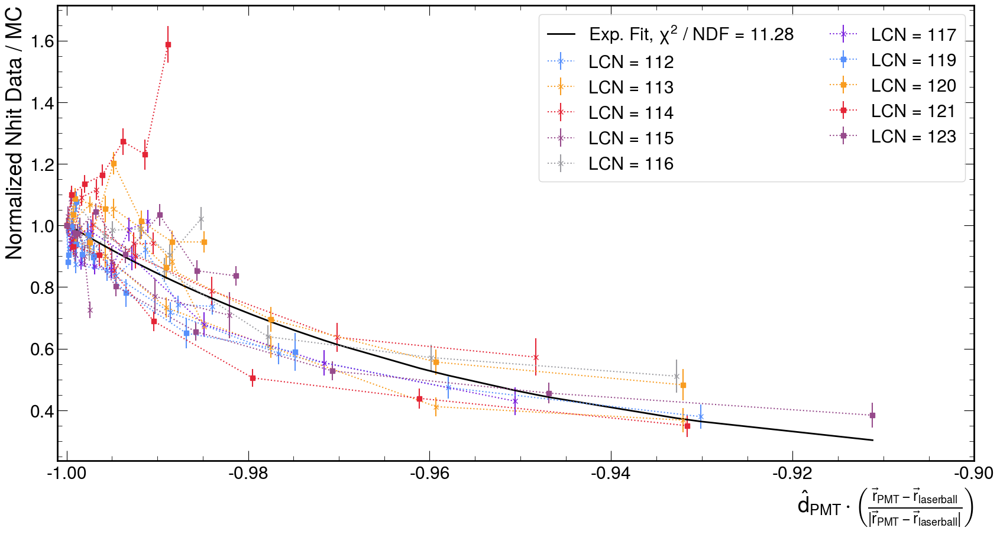

In [17]:
plt.figure(figsize=(20, 10))
xs = []
ys = []
yerrs = []
for ilcn, lcn in enumerate(pmtinfo.get_lcns_by_type(1)):
    if lcn == 118: continue
    if lcn == 122: continue
        
    ratios = []
    ratio_errs = []
    costhetas = []
    for iz, zpos in enumerate(scanned_zpos):
        pmtdir = pmtinfo.dir
        laserdir = (pmtinfo.pos - np.asarray([0, 0, zpos]))
        laserdir /= np.linalg.norm(laserdir, axis=1)[:, np.newaxis]
        costheta = np.einsum('ij,ij->i', laserdir, pmtdir)
        ratios.append(zpos_wvl_hitratio[iz, ilcn])
        ratio_errs.append(zpos_wvl_hitratio_err[iz, ilcn])
        costhetas.append(costheta[pmtinfo.lcn_to_id([lcn])][0])
    fmt = 'x:' if ilcn//6 == 0 else 's:'
    # print(lcn, ratios[6])
    renorm = np.mean(ratios[6])
    ratio_errs /= renorm
    plt.errorbar(costhetas, ratios / renorm, yerr=ratio_errs, fmt=fmt, label=f"LCN = {lcn}")
    for x, y, ye in zip(costhetas, ratios / renorm, ratio_errs):
        xs.append(x)
        ys.append(y)
        yerrs.append(ye)
xs = np.asarray(xs)
ys = np.asarray(ys)
yerrs = np.asarray(yerrs)

from scipy.optimize import curve_fit

def fitfunc(x, a, s, c):
    return a * np.exp(-(x+1)/s) + c

fitresult, pcov = curve_fit(fitfunc, xs, ys, sigma=yerrs, absolute_sigma=True)

chisquare = np.sum((ys - fitfunc(xs, *fitresult))**2 / yerrs**2)
print(chisquare)
ndf = len(xs) - 13 - 3
print(fitresult)
plt.plot(np.sort(xs), fitfunc(np.sort(xs), *fitresult), 'k', label=r'Exp. Fit, $\chi^2$ / NDF = ' + f"{chisquare / ndf:.2f}", linewidth=2)
plt.xlim(-1.001, -0.9)
plt.legend(frameon=True, ncol=2)
plt.xlabel(r"$\hat{d}_{PMT} \cdot \left(\frac{\vec{r}_{PMT} - \vec{r}_{laserball}}{|\vec{r}_{PMT} - \vec{r}_{laserball}|}\right)$")
plt.ylabel("Normalized Nhit Data / MC")